# 3DBreastNet - 128x128x128 Voxel Reconstruction

## 1. Install Dependencies

In [20]:
!uv pip install torch torchvision tifffile opencv-python numpy scipy scikit-image matplotlib tqdm pandas

Using Python 3.11.9 environment at: /mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/.venv
Checked 10 packages in 6ms


In [21]:
# tqdm.notebook is provided by tqdm; ipywidgets enables the notebook progress UI.
!uv pip install tqdm ipywidgets

Using Python 3.11.9 environment at: /mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/.venv
Checked 2 packages in 4ms


## 2. Model Definitions

In [22]:
import math, torch, torch.nn as nn, torch.nn.functional as F

# ── U-Net (for mask generation, frozen) ──────────────────────
class DoubleConv(nn.Module):
    def __init__(self, inc, outc, drop=0.0):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(inc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True),
            nn.Conv2d(outc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True),
            nn.Dropout2d(drop) if drop > 0 else nn.Identity())
    def forward(self, x): return self.block(x)

class UNet(nn.Module):
    def __init__(self, in_c=1, out_c=1, b=64, drop=0.2):
        super().__init__()
        self.pool = nn.MaxPool2d(2)
        self.enc1 = DoubleConv(in_c, b, 0.0)
        self.enc2 = DoubleConv(b, b*2, 0.0)
        self.enc3 = DoubleConv(b*2, b*4, 0.1)
        self.enc4 = DoubleConv(b*4, b*8, 0.1)
        self.bottleneck = DoubleConv(b*8, b*16, drop)
        self.up4 = nn.ConvTranspose2d(b*16, b*8, 2, stride=2)
        self.dec4 = DoubleConv(b*16, b*8, 0.1)
        self.up3 = nn.ConvTranspose2d(b*8, b*4, 2, stride=2)
        self.dec3 = DoubleConv(b*8, b*4, 0.1)
        self.up2 = nn.ConvTranspose2d(b*4, b*2, 2, stride=2)
        self.dec2 = DoubleConv(b*4, b*2, 0.0)
        self.up1 = nn.ConvTranspose2d(b*2, b, 2, stride=2)
        self.dec1 = DoubleConv(b*2, b, 0.0)
        self.out = nn.Conv2d(b, out_c, 1)
    def forward(self, x):
        e1=self.enc1(x); e2=self.enc2(self.pool(e1))
        e3=self.enc3(self.pool(e2)); e4=self.enc4(self.pool(e3))
        b=self.bottleneck(self.pool(e4))
        d4=self.dec4(torch.cat([self.up4(b),e4],1))
        d3=self.dec3(torch.cat([self.up3(d4),e3],1))
        d2=self.dec2(torch.cat([self.up2(d3),e2],1))
        d1=self.dec1(torch.cat([self.up1(d2),e1],1))
        return self.out(d1)

# ── 3DBreastNet U-Net (with Skip Projections) ──────────────────────
class DoubleConv2D(nn.Module):
    def __init__(self, inc, outc, drop=0.2):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(inc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True),
            nn.Dropout2d(drop) if drop > 0 else nn.Identity(),
            nn.Conv2d(outc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True))
    def forward(self, x): return self.block(x)

class DoubleConv3D(nn.Module):
    def __init__(self, inc, outc, drop=0.2):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv3d(inc, outc, 3, padding=1, bias=False),
            nn.BatchNorm3d(outc), nn.ReLU(True),
            nn.Dropout3d(drop) if drop > 0 else nn.Identity(),
            nn.Conv3d(outc, outc, 3, padding=1, bias=False),
            nn.BatchNorm3d(outc), nn.ReLU(True))
    def forward(self, x): return self.block(x)

def _init(m):
    if isinstance(m, (nn.Conv2d, nn.Conv3d, nn.ConvTranspose2d, nn.ConvTranspose3d)):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None: nn.init.constant_(m.bias, 0)
    elif isinstance(m, (nn.BatchNorm2d, nn.BatchNorm3d)):
        nn.init.constant_(m.weight, 1); nn.init.constant_(m.bias, 0)
    elif isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None: nn.init.constant_(m.bias, 0)

class SkipProjection(nn.Module):
    def __init__(self, in_ch, out_ch, depth):
        super().__init__()
        self.depth = depth
        self.proj = nn.Sequential(
            nn.Conv3d(in_ch, out_ch, kernel_size=1, bias=False),
            nn.BatchNorm3d(out_ch),
            nn.ReLU(inplace=True),
        )
    def forward(self, feat_2d):
        feat_3d = feat_2d.unsqueeze(2).expand(-1, -1, self.depth, -1, -1)
        return self.proj(feat_3d)

class DecoderBlock3D(nn.Module):
    def __init__(self, in_ch, skip_ch, out_ch, drop=0.0):
        super().__init__()
        self.up = nn.ConvTranspose3d(in_ch, in_ch, kernel_size=2, stride=2)
        self.block = DoubleConv3D(in_ch + skip_ch, out_ch, drop)
    def forward(self, x, skip):
        x = self.up(x)
        if x.shape[2:] != skip.shape[2:]:
            x = F.interpolate(x, size=skip.shape[2:], mode='trilinear', align_corners=False)
        x = torch.cat([x, skip], dim=1)
        return self.block(x)

class Encoder2D_UNet(nn.Module):
    def __init__(self, drop=0.25):
        super().__init__()
        self.pool = nn.MaxPool2d(2)
        self.enc1 = DoubleConv2D(5, 32, 0)
        self.enc2 = DoubleConv2D(32, 64, 0)
        self.enc3 = DoubleConv2D(64, 128, drop)
        self.enc4 = DoubleConv2D(128, 256, drop)
        self.enc5 = DoubleConv2D(256, 512, drop)
        self.enc6 = DoubleConv2D(512, 512, drop)
        self.fc = nn.Sequential(nn.Dropout(drop), nn.Linear(512*2*2, 1000))
        self.apply(_init)
    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        e5 = self.enc5(self.pool(e4))
        e6 = self.enc6(self.pool(e5))
        latent = self.fc(self.pool(e6).view(x.size(0), -1))
        return latent, (e1, e2, e3, e4, e5, e6)

class Decoder3D_UNet(nn.Module):
    def __init__(self, drop=0.25):
        super().__init__()
        self.fc = nn.Linear(1000, 512*2*2*2)
        self.proj6 = SkipProjection(512, 128, depth=4)
        self.proj5 = SkipProjection(512, 128, depth=8)
        self.proj4 = SkipProjection(256, 64, depth=16)
        self.proj3 = SkipProjection(128, 32, depth=32)
        self.proj2 = SkipProjection(64, 16, depth=64)
        self.proj1 = SkipProjection(32, 8, depth=128)
        self.d1 = DecoderBlock3D(512, 128, 256, drop)
        self.d2 = DecoderBlock3D(256, 128, 128, drop)
        self.d3 = DecoderBlock3D(128, 64, 64, drop)
        self.d4 = DecoderBlock3D(64, 32, 32, 0)
        self.d5 = DecoderBlock3D(32, 16, 16, 0)
        self.d6 = DecoderBlock3D(16, 8, 8, 0)
        self.out = nn.Sequential(nn.Conv3d(8, 1, 1), nn.Sigmoid())
        self.apply(_init)
        nn.init.constant_(self.out[0].bias, -4.0)
    
    def forward(self, latent, skips):
        e1, e2, e3, e4, e5, e6 = skips
        x = self.fc(latent).view(latent.size(0), 512, 2, 2, 2)
        x = self.d1(x, self.proj6(e6))
        x = self.d2(x, self.proj5(e5))
        x = self.d3(x, self.proj4(e4))
        x = self.d4(x, self.proj3(e3))
        x = self.d5(x, self.proj2(e2))
        x = self.d6(x, self.proj1(e1))
        return self.out(x)

class BreastNet3D_UNet(nn.Module):
    def __init__(self, drop=0.25):
        super().__init__()
        self.encoder = Encoder2D_UNet(drop)
        self.decoder = Decoder3D_UNet(drop)
    def forward(self, x):
        latent, skips = self.encoder(x)
        return self.decoder(latent, skips)

def build_dual_ellipsoid_prior(volume_size=128, device='cuda'):
    V = volume_size
    zz, yy, xx = torch.meshgrid(
        torch.linspace(0, 1, V, device=device),
        torch.linspace(0, 1, V, device=device),
        torch.linspace(0, 1, V, device=device),
        indexing='ij'
    )
    cx_L, cx_R = 0.30, 0.70
    cy = 0.55
    cz = 0.50
    ax, ay, az = 0.20, 0.35, 0.28
    def ellipsoid_sdf(cx):
        return ((xx - cx)**2 / ax**2 + (yy - cy)**2 / ay**2 + (zz - cz)**2 / az**2)
    e_L = ellipsoid_sdf(cx_L)
    e_R = ellipsoid_sdf(cx_R)
    prior = torch.sigmoid(8.0 * (1.0 - torch.minimum(e_L, e_R)))
    return prior.unsqueeze(0).unsqueeze(0)

class ShapePriorLoss(nn.Module):
    def __init__(self, volume_size=128, device='cuda', weight=0.3):
        super().__init__()
        self.weight = weight
        prior = build_dual_ellipsoid_prior(volume_size, device).detach()
        self.register_buffer('prior', prior)
    def forward(self, V_pred):
        outside_mass = V_pred * (1.0 - self.prior)
        return self.weight * outside_mass.mean()

def render_projection(volume, theta_deg):
    B,C,D,H,W = volume.shape; dev = volume.device
    if not isinstance(theta_deg, torch.Tensor):
        theta_deg = torch.full((B,), float(theta_deg), device=dev, dtype=torch.float32)
    theta_deg = theta_deg.float()
    rad = theta_deg * math.pi / 180.0
    c, s = torch.cos(rad), torch.sin(rad)
    z, o = torch.zeros_like(rad), torch.ones_like(rad)
    mat = torch.stack([torch.stack([c,z,s,z],-1),
                       torch.stack([z,o,z,z],-1),
                       torch.stack([-s,z,c,z],-1)], -2)
    grid = F.affine_grid(mat, volume.shape, align_corners=False)
    Vr = F.grid_sample(volume, grid, mode='bilinear', padding_mode='zeros', align_corners=False)
    return 1.0 - torch.exp(-Vr.squeeze(1).sum(dim=1, keepdim=True))

def dice_loss(pred, target, eps=1e-6):
    p, t = pred.float(), target.float()
    num = 2*(p*t).sum()
    den = p.pow(2).sum() + t.pow(2).sum() + eps
    return 1 - num/den

VIEW_WINDOWS = [(-90.,-67.5),(-67.5,-22.5),(-22.5,22.5),(22.5,67.5),(67.5,90.)]
val_angles = [-90., -45., 0., 45., 90.]


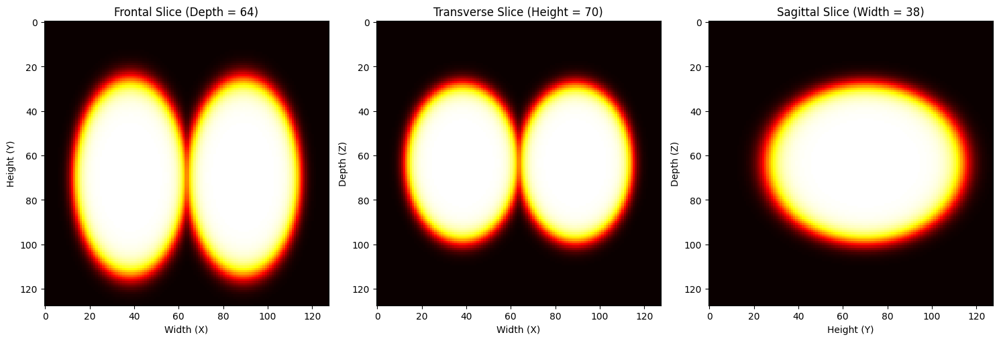

In [31]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

# Build the prior on CPU for visualization
prior_tensor = build_dual_ellipsoid_prior(128, 'cpu')
prior_np = prior_tensor.squeeze().numpy()  # Shape: (128, 128, 128)

# We visualize 3 orthogonal slices through the center of the volume
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# 1. Frontal Slice (Depth = 64) - Coronal plane
axes[0].imshow(prior_np[64, :, :], cmap='hot', vmin=0, vmax=1)
axes[0].set_title('Frontal Slice (Depth = 64)')
axes[0].set_xlabel('Width (X)')
axes[0].set_ylabel('Height (Y)')

# 2. Transverse Slice (Height = 70) - Axial plane
axes[1].imshow(prior_np[:, 70, :], cmap='hot', vmin=0, vmax=1)
axes[1].set_title('Transverse Slice (Height = 70)')
axes[1].set_xlabel('Width (X)')
axes[1].set_ylabel('Depth (Z)')

# 3. Sagittal Slice (Width = 38) - Right Breast center
axes[2].imshow(prior_np[:, :, 38], cmap='hot', vmin=0, vmax=1)
axes[2].set_title('Sagittal Slice (Width = 38)')
axes[2].set_xlabel('Height (Y)')
axes[2].set_ylabel('Depth (Z)')

plt.tight_layout()
plt.show()

## Visualize Smoothed Ground Truth (Pre-Training Check)

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import random
import torch

# Quick verification of the smoothed 2D masks before training
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load Frozen Segmentor just for visualization
unet_test = UNet().to(device)
unet_ckpt = r'/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/breast_segmentation_unet_best_gpu.pth'
if Path(unet_ckpt).exists():
    unet_test.load_state_dict(torch.load(unet_ckpt, map_location=device, weights_only=False))
unet_test.eval()

tiff_base = r'/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient'
print('Loading patients for verification...')
groups_test = build_patient_groups(tiff_base)

if len(groups_test) > 0:
    test_dataset = PatientDataset(random.sample(groups_test, 1), unet_test, device)
    sample = test_dataset[0]
    m5 = sample['masks_5ch'].cpu().numpy()
    pid = sample['patient_id']

    fig, axes = plt.subplots(1, 5, figsize=(18, 4))
    fig.suptitle(f'Smoothed Ground Truth Masks: Patient {pid}', fontsize=14, fontweight='bold')
    views = ['Right Lateral', 'Right Oblique', 'Frontal', 'Left Oblique', 'Left Lateral']

    for i in range(5):
        axes[i].imshow(m5[i], cmap='gray', vmin=0, vmax=1)
        axes[i].set_title(views[i])
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print('No patients found.')

## 3. Training

In [32]:
import os, sys, time, random, math
import numpy as np, cv2, tifffile, pandas as pd
from pathlib import Path
from dataclasses import dataclass
from typing import Dict
from tqdm.auto import tqdm
import torch
from torch.utils.data import Dataset, DataLoader

# Configuration for training
CFG = {
    "epochs":       400,
    "batch_size":   2,
    "lr":           1e-4,
    "betas":        (0.5, 0.9),
    "n_per_view":   2,
    "seed":         42,
    "patience":     50,
    "ckpt_dir":     "checkpoints_3d",
    "tiff_base":    r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient",
    "unet_ckpt":    r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/breast_segmentation_unet_best_gpu.pth",
}

@dataclass
class PatientGroup:
    patient_id: str
    label: str
    views: Dict[str, Path]

def get_view_key(filename):
    n = filename.lower()
    if "right later" in n: return "RL"
    if "right obli"  in n: return "RO"
    if "frontal" in n or "anterior" in n: return "F"
    if "left obliq"  in n: return "LO"
    if "left later"  in n: return "LL"
    return None

def build_patient_groups(tiff_base):
    tb = Path(tiff_base)
    pd_ = {}
    for tp in tb.rglob("*.tiff"):
        parts = tp.relative_to(tb).parts
        if len(parts) < 3: continue
        pid, lab, fn = parts[0], parts[1], parts[-1]
        vk = get_view_key(fn)
        if not vk: continue
        key = (pid, lab)
        if key not in pd_: pd_[key] = {"views": {}}
        pd_[key]["views"][vk] = tp
    groups = []
    for (pid, lab), d in pd_.items():
        if len(d["views"]) == 5:
            groups.append(PatientGroup(pid, lab, d["views"]))
    groups.sort(key=lambda g: g.patient_id)
    return groups

class PatientDataset(Dataset):
    def __init__(self, groups, unet, device, img_sz=256):
        self.groups, self.unet, self.device = groups, unet, device
        self.img_sz = img_sz
        self.views = ["RL","RO","F","LO","LL"]
    def __len__(self): return len(self.groups)
    def __getitem__(self, idx):
        g = self.groups[idx]; thermals, masks = [], []
        for v in self.views:
            raw = tifffile.imread(str(g.views[v])).astype(np.float32)
            raw = cv2.resize(raw, (self.img_sz, self.img_sz))
            mn, mx = raw.min(), raw.max()
            norm = (raw - mn) / (mx - mn + 1e-8)
            thermals.append(norm)
            with torch.no_grad():
                inp = torch.tensor(norm).unsqueeze(0).unsqueeze(0).to(self.device)
                m = torch.sigmoid(self.unet(inp)).squeeze().cpu().numpy()
            m_smooth = cv2.GaussianBlur(m, (5, 5), 0)
            m_resized = cv2.resize(m_smooth, (128,128), interpolation=cv2.INTER_LINEAR)
            masks.append(m_resized)
        return {
            "masks_5ch": torch.tensor(np.stack(masks), dtype=torch.float32),
            "thermals_5ch": torch.tensor(np.stack(thermals), dtype=torch.float32),
            "patient_id": g.patient_id, "label": g.label,
        }

def train(cfg):
    torch.manual_seed(cfg["seed"]); np.random.seed(cfg["seed"])
    torch.cuda.manual_seed_all(cfg["seed"])
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Device: {device}")

    # Initialize frozen U-Net
    unet = UNet().to(device)
    if os.path.exists(cfg["unet_ckpt"]):
        unet.load_state_dict(torch.load(cfg["unet_ckpt"], map_location=device))
    unet.eval()
    for p in unet.parameters(): p.requires_grad = False

    # Data
    groups = build_patient_groups(cfg["tiff_base"])
    rng = random.Random(cfg["seed"])
    ben = [g for g in groups if g.label.lower()=="benign"]
    mal = [g for g in groups if g.label.lower()!="benign"]
    rng.shuffle(ben); rng.shuffle(mal)
    s = 0.78
    trn = ben[:int(len(ben)*s)] + mal[:int(len(mal)*s)]
    val = ben[int(len(ben)*s):] + mal[int(len(mal)*s):]
    print(f"Train: {len(trn)} | Val: {len(val)}")

    trn_dl = DataLoader(PatientDataset(trn, unet, device), batch_size=cfg["batch_size"], shuffle=True, drop_last=True)
    val_dl = DataLoader(PatientDataset(val, unet, device), batch_size=cfg["batch_size"], shuffle=False)

    # NEW: Unified 3D Model
    model = BreastNet3D_UNet().to(device)
    shape_prior_loss = ShapePriorLoss(volume_size=128, device=device, weight=0.3)
    
    opt = torch.optim.Adam(model.parameters(), lr=cfg["lr"], betas=cfg["betas"])
    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, mode="max", factor=0.5, patience=30, min_lr=1e-6)
    scaler = torch.amp.GradScaler("cuda", enabled=torch.cuda.is_available())
    Path(cfg["ckpt_dir"]).mkdir(parents=True, exist_ok=True)

    best_dice, no_imp = 0.0, 0
    hist = {"epoch":[], "train_loss":[], "val_loss":[], "val_dice":[], "val_hd":[]}

    for epoch in range(1, cfg["epochs"]+1):
        t0 = time.time()
        
        # ── train ──
        model.train()
        ep_loss = 0.0
        for batch in tqdm(trn_dl, desc=f"E{epoch:03d} train", leave=False):
            m5 = batch["masks_5ch"].to(device)
            B = m5.size(0)
            opt.zero_grad(set_to_none=True)
            with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
                vol = model(m5)
            
            vol = vol.float()
            loss = torch.tensor(0.0, device=device)
            for i in range(5):
                lo, hi = VIEW_WINDOWS[i]
                for _ in range(cfg["n_per_view"]):
                    th = torch.rand(B, device=device)*(hi-lo)+lo
                    loss = loss + dice_loss(render_projection(vol, th), m5[:, i:i+1])
            loss = loss / (5*cfg["n_per_view"])
            
            # Apply Shape Prior Loss
            loss = loss + shape_prior_loss(vol)

            scaler.scale(loss).backward()
            scaler.unscale_(opt)
            if torch.isfinite(loss):
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                scaler.step(opt)
            scaler.update()
            ep_loss += loss.item() if torch.isfinite(loss) else 0.0
        ep_loss /= max(len(trn_dl), 1)

        # ── val ──
        model.eval()
        vl, vd, cnt = 0., 0., 0
        with torch.no_grad():
            for batch in tqdm(val_dl, desc=f"E{epoch:03d} val", leave=False):
                m5 = batch["masks_5ch"].to(device); B = m5.size(0)
                with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
                    vol = model(m5)
                
                vol = vol.float()
                for i in range(5):
                    th = torch.full((B,), val_angles[i], device=device)
                    proj = render_projection(vol, th)
                    dl = dice_loss(proj, m5[:, i:i+1])
                    vl += dl.item(); vd += (1-dl).item()
                    cnt += B
        vl /= max(len(val_dl)*5,1); vd /= max(len(val_dl)*5,1)
        elapsed = time.time()-t0

        hist["epoch"].append(epoch); hist["train_loss"].append(ep_loss)
        hist["val_loss"].append(vl); hist["val_dice"].append(vd)
        sched.step(vd)

        print(f"E{epoch:03d} | loss={ep_loss:.4f} | vl={vl:.4f} vd={vd:.4f} | {elapsed:.1f}s")
        ckpt = {"epoch": epoch, "model": model.state_dict(), "best_dice": max(best_dice,vd), "cfg": cfg, "hist": hist}
        torch.save(ckpt, Path(cfg["ckpt_dir"])/"3dbreastnet_last.pth")
        if vd > best_dice:
            best_dice = vd; no_imp = 0
            torch.save(ckpt, Path(cfg["ckpt_dir"])/"3dbreastnet_best.pth")
            print(f"  ★ new best dice={best_dice:.4f}")
        else:
            no_imp += 1
            if no_imp >= cfg["patience"]: break

if __name__ == "__main__":
    train(CFG)


E198 val:   0%|          | 0/14 [00:00<?, ?it/s]

E198 | loss=0.1061 | vl=0.1127 vd=0.8873 | 16.4s


E199 train:   0%|          | 0/47 [00:00<?, ?it/s]

E199 val:   0%|          | 0/14 [00:00<?, ?it/s]

E199 | loss=0.1060 | vl=0.1110 vd=0.8890 | 15.9s


E200 train:   0%|          | 0/47 [00:00<?, ?it/s]

E200 val:   0%|          | 0/14 [00:00<?, ?it/s]

E200 | loss=0.1065 | vl=0.1109 vd=0.8891 | 16.4s


E201 train:   0%|          | 0/47 [00:00<?, ?it/s]

E201 val:   0%|          | 0/14 [00:00<?, ?it/s]

E201 | loss=0.1067 | vl=0.1122 vd=0.8878 | 16.3s


E202 train:   0%|          | 0/47 [00:00<?, ?it/s]

E202 val:   0%|          | 0/14 [00:00<?, ?it/s]

E202 | loss=0.1058 | vl=0.1117 vd=0.8883 | 16.3s


E203 train:   0%|          | 0/47 [00:00<?, ?it/s]

E203 val:   0%|          | 0/14 [00:00<?, ?it/s]

E203 | loss=0.1090 | vl=0.1098 vd=0.8902 | 16.5s


E204 train:   0%|          | 0/47 [00:00<?, ?it/s]

E204 val:   0%|          | 0/14 [00:00<?, ?it/s]

E204 | loss=0.1064 | vl=0.1100 vd=0.8900 | 16.5s


E205 train:   0%|          | 0/47 [00:00<?, ?it/s]

E205 val:   0%|          | 0/14 [00:00<?, ?it/s]

E205 | loss=0.1056 | vl=0.1115 vd=0.8885 | 16.6s


E206 train:   0%|          | 0/47 [00:00<?, ?it/s]

E206 val:   0%|          | 0/14 [00:00<?, ?it/s]

E206 | loss=0.1056 | vl=0.1092 vd=0.8908 | 16.8s


E207 train:   0%|          | 0/47 [00:00<?, ?it/s]

E207 val:   0%|          | 0/14 [00:00<?, ?it/s]

E207 | loss=0.1053 | vl=0.1117 vd=0.8883 | 16.4s


E208 train:   0%|          | 0/47 [00:00<?, ?it/s]

E208 val:   0%|          | 0/14 [00:00<?, ?it/s]

E208 | loss=0.1067 | vl=0.1113 vd=0.8887 | 16.3s


E209 train:   0%|          | 0/47 [00:00<?, ?it/s]

E209 val:   0%|          | 0/14 [00:00<?, ?it/s]

E209 | loss=0.1063 | vl=0.1087 vd=0.8913 | 16.4s


E210 train:   0%|          | 0/47 [00:00<?, ?it/s]

E210 val:   0%|          | 0/14 [00:00<?, ?it/s]

E210 | loss=0.1050 | vl=0.1102 vd=0.8898 | 16.0s


E211 train:   0%|          | 0/47 [00:00<?, ?it/s]

E211 val:   0%|          | 0/14 [00:00<?, ?it/s]

E211 | loss=0.1047 | vl=0.1099 vd=0.8901 | 15.9s


E212 train:   0%|          | 0/47 [00:00<?, ?it/s]

E212 val:   0%|          | 0/14 [00:00<?, ?it/s]

E212 | loss=0.1072 | vl=0.1092 vd=0.8908 | 16.4s


E213 train:   0%|          | 0/47 [00:00<?, ?it/s]

E213 val:   0%|          | 0/14 [00:00<?, ?it/s]

E213 | loss=0.1038 | vl=0.1087 vd=0.8913 | 16.4s


E214 train:   0%|          | 0/47 [00:00<?, ?it/s]

E214 val:   0%|          | 0/14 [00:00<?, ?it/s]

E214 | loss=0.1064 | vl=0.1100 vd=0.8900 | 16.4s


E215 train:   0%|          | 0/47 [00:00<?, ?it/s]

E215 val:   0%|          | 0/14 [00:00<?, ?it/s]

E215 | loss=0.1073 | vl=0.1094 vd=0.8906 | 16.5s


E216 train:   0%|          | 0/47 [00:00<?, ?it/s]

E216 val:   0%|          | 0/14 [00:00<?, ?it/s]

E216 | loss=0.1046 | vl=0.1099 vd=0.8901 | 16.3s


E217 train:   0%|          | 0/47 [00:00<?, ?it/s]

E217 val:   0%|          | 0/14 [00:00<?, ?it/s]

E217 | loss=0.1053 | vl=0.1101 vd=0.8899 | 16.3s


E218 train:   0%|          | 0/47 [00:00<?, ?it/s]

E218 val:   0%|          | 0/14 [00:00<?, ?it/s]

E218 | loss=0.1052 | vl=0.1120 vd=0.8880 | 16.2s


E219 train:   0%|          | 0/47 [00:00<?, ?it/s]

E219 val:   0%|          | 0/14 [00:00<?, ?it/s]

E219 | loss=0.1050 | vl=0.1106 vd=0.8894 | 16.4s


E220 train:   0%|          | 0/47 [00:00<?, ?it/s]

E220 val:   0%|          | 0/14 [00:00<?, ?it/s]

E220 | loss=0.1054 | vl=0.1104 vd=0.8896 | 16.5s


E221 train:   0%|          | 0/47 [00:00<?, ?it/s]

E221 val:   0%|          | 0/14 [00:00<?, ?it/s]

E221 | loss=0.1051 | vl=0.1101 vd=0.8899 | 16.5s


E222 train:   0%|          | 0/47 [00:00<?, ?it/s]

E222 val:   0%|          | 0/14 [00:00<?, ?it/s]

E222 | loss=0.1067 | vl=0.1102 vd=0.8898 | 16.1s


E223 train:   0%|          | 0/47 [00:00<?, ?it/s]

E223 val:   0%|          | 0/14 [00:00<?, ?it/s]

E223 | loss=0.1050 | vl=0.1085 vd=0.8915 | 16.5s


E224 train:   0%|          | 0/47 [00:00<?, ?it/s]

E224 val:   0%|          | 0/14 [00:00<?, ?it/s]

E224 | loss=0.1052 | vl=0.1082 vd=0.8918 | 16.4s


E225 train:   0%|          | 0/47 [00:00<?, ?it/s]

E225 val:   0%|          | 0/14 [00:00<?, ?it/s]

E225 | loss=0.1070 | vl=0.1101 vd=0.8899 | 16.4s


In [33]:
from scipy.ndimage import label
import scipy.ndimage
from scipy.spatial.distance import directed_hausdorff

def remove_floating_residuals(V_pred_np, threshold=0.5):
    """Retains only the largest connected component in the 3D grid."""
    binary_vol = V_pred_np > threshold
    labeled_vol, num_features = label(binary_vol)
    if num_features == 0:
        return V_pred_np
    sizes = np.bincount(labeled_vol.ravel())
    sizes[0] = 0
    largest_label = sizes.argmax()
    cleaned_vol = V_pred_np.copy()
    cleaned_vol[labeled_vol != largest_label] = 0.0
    return cleaned_vol

def compute_metrics(pred_proj, target_sil, threshold=0.5):
    pred_bin = (pred_proj >= threshold).astype(np.float32)
    tgt = target_sil.astype(np.float32)
    TP = (pred_bin * tgt).sum()
    TN = ((1 - pred_bin) * (1 - tgt)).sum()
    FP = (pred_bin * (1 - tgt)).sum()
    FN = ((1 - pred_bin) * tgt).sum()
    N = pred_bin.size
    accuracy = (TP + TN) / N
    dice = (2 * TP) / (2 * TP + FP + FN + 1e-6)
    jaccard = TP / (TP + FP + FN + 1e-6)
    pred_pts = np.argwhere(pred_bin > 0).astype(float)
    tgt_pts = np.argwhere(tgt > 0).astype(float)
    if len(pred_pts) == 0 or len(tgt_pts) == 0:
        hausdorff = float('nan')
    else:
        hausdorff = max(directed_hausdorff(pred_pts, tgt_pts)[0], directed_hausdorff(tgt_pts, pred_pts)[0])
    return {'Accuracy': accuracy, 'Dice': dice, 'Jaccard': jaccard, 'Hausdorff': hausdorff}

## View Training Metrics (Local Laptop)
Run this cell to extract the loss and dice curves from the saved checkpoint.

Loading checkpoint: checkpoints_3d/3dbreastnet_best.pth


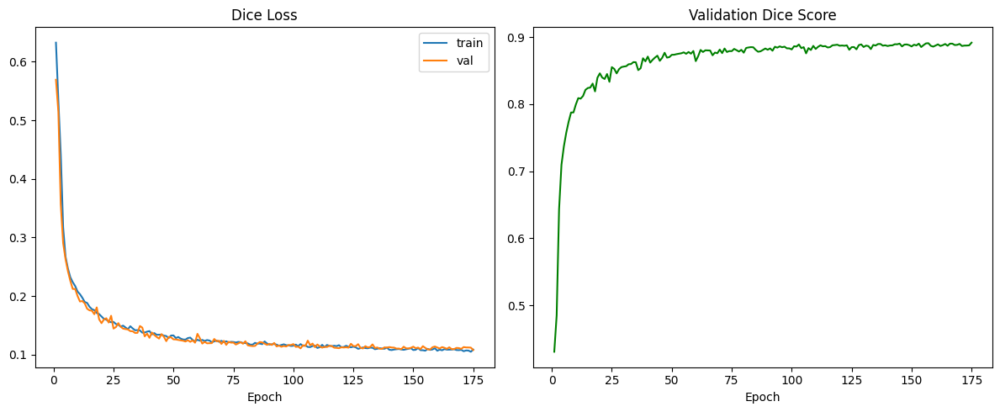

In [36]:
%matplotlib inline
# ════════════════════════════════════════════════════════════════
# PLOT TRAINING METRICS FROM SAVED CHECKPOINT (LAPTOP LOCAL)
# ════════════════════════════════════════════════════════════════
import torch
import matplotlib.pyplot as plt
from pathlib import Path

# Relative path to your local checkpoint
ckpt_path = Path("checkpoints_3d/3dbreastnet_best.pth")

if ckpt_path.exists():
    print(f"Loading checkpoint: {ckpt_path}")
    ckpt = torch.load(ckpt_path, map_location="cpu", weights_only=False)
    hist = ckpt["hist"]
    
    # Changed to 2 plots since HD95 is computed later
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))
    
    ax[0].plot(hist["epoch"], hist["train_loss"], label="train")
    ax[0].plot(hist["epoch"], hist["val_loss"], label="val")
    ax[0].set_title("Dice Loss")
    ax[0].legend()
    
    ax[1].plot(hist["epoch"], hist["val_dice"], color="green")
    ax[1].set_title("Validation Dice Score")
    
    for a in ax: a.set_xlabel("Epoch")
    plt.tight_layout()
    plt.show()
else:
    print(f"Checkpoint not found at {ckpt_path}.")

### Fine Tuning

Fine-tuning on device: cuda
Patients: 137 | Complete: 122 | Skipped: 15 | B=96 M=26
Train: 94 | Val: 28
 Loading baseline model weights from: checkpoints_3d/3dbreastnet_best.pth
 Model loaded successfully! Initial Best Dice: 0.8919

 Starting high-fidelity voxel grid fine-tuning...


FT Epoch 001 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 001 val:   0%|          | 0/14 [00:00<?, ?it/s]

E001 | loss=0.0653 | vl=0.1095 vd=0.8905 hd=10.04 | lr=0.000020 | 17.7s


FT Epoch 002 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 002 val:   0%|          | 0/14 [00:00<?, ?it/s]

E002 | loss=0.0652 | vl=0.1090 vd=0.8910 hd=9.99 | lr=0.000020 | 17.8s


FT Epoch 003 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 003 val:   0%|          | 0/14 [00:00<?, ?it/s]

E003 | loss=0.0642 | vl=0.1084 vd=0.8916 hd=9.96 | lr=0.000020 | 17.4s


FT Epoch 004 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 004 val:   0%|          | 0/14 [00:00<?, ?it/s]

E004 | loss=0.0650 | vl=0.1080 vd=0.8920 hd=9.97 | lr=0.000020 | 17.5s
  ★ New best fine-tuned reconstruction dice=0.8920! Weights saved.


FT Epoch 005 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 005 val:   0%|          | 0/14 [00:00<?, ?it/s]

E005 | loss=0.0646 | vl=0.1078 vd=0.8922 hd=9.96 | lr=0.000020 | 17.4s
  ★ New best fine-tuned reconstruction dice=0.8922! Weights saved.


FT Epoch 006 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 006 val:   0%|          | 0/14 [00:00<?, ?it/s]

E006 | loss=0.0641 | vl=0.1073 vd=0.8927 hd=9.89 | lr=0.000020 | 17.5s
  ★ New best fine-tuned reconstruction dice=0.8927! Weights saved.


FT Epoch 007 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 007 val:   0%|          | 0/14 [00:00<?, ?it/s]

E007 | loss=0.0645 | vl=0.1071 vd=0.8929 hd=9.94 | lr=0.000020 | 17.5s
  ★ New best fine-tuned reconstruction dice=0.8929! Weights saved.


FT Epoch 008 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 008 val:   0%|          | 0/14 [00:00<?, ?it/s]

E008 | loss=0.0639 | vl=0.1066 vd=0.8934 hd=9.98 | lr=0.000020 | 17.6s
  ★ New best fine-tuned reconstruction dice=0.8934! Weights saved.


FT Epoch 009 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 009 val:   0%|          | 0/14 [00:00<?, ?it/s]

E009 | loss=0.0646 | vl=0.1063 vd=0.8937 hd=9.97 | lr=0.000020 | 17.7s
  ★ New best fine-tuned reconstruction dice=0.8937! Weights saved.


FT Epoch 010 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 010 val:   0%|          | 0/14 [00:00<?, ?it/s]

E010 | loss=0.0634 | vl=0.1072 vd=0.8928 hd=10.01 | lr=0.000020 | 17.7s


FT Epoch 011 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 011 val:   0%|          | 0/14 [00:00<?, ?it/s]

E011 | loss=0.0637 | vl=0.1072 vd=0.8928 hd=10.02 | lr=0.000020 | 17.6s


FT Epoch 012 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 012 val:   0%|          | 0/14 [00:00<?, ?it/s]

E012 | loss=0.0643 | vl=0.1060 vd=0.8940 hd=9.96 | lr=0.000020 | 17.6s
  ★ New best fine-tuned reconstruction dice=0.8940! Weights saved.


FT Epoch 013 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 013 val:   0%|          | 0/14 [00:00<?, ?it/s]

E013 | loss=0.0631 | vl=0.1065 vd=0.8935 hd=9.93 | lr=0.000020 | 17.4s


FT Epoch 014 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 014 val:   0%|          | 0/14 [00:00<?, ?it/s]

E014 | loss=0.0636 | vl=0.1067 vd=0.8933 hd=9.93 | lr=0.000020 | 17.9s


FT Epoch 015 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 015 val:   0%|          | 0/14 [00:00<?, ?it/s]

E015 | loss=0.0635 | vl=0.1065 vd=0.8935 hd=9.95 | lr=0.000020 | 17.8s


FT Epoch 016 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 016 val:   0%|          | 0/14 [00:00<?, ?it/s]

E016 | loss=0.0633 | vl=0.1055 vd=0.8945 hd=9.86 | lr=0.000020 | 17.2s
  ★ New best fine-tuned reconstruction dice=0.8945! Weights saved.


FT Epoch 017 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 017 val:   0%|          | 0/14 [00:00<?, ?it/s]

E017 | loss=0.0643 | vl=0.1056 vd=0.8944 hd=9.89 | lr=0.000020 | 18.0s


FT Epoch 018 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 018 val:   0%|          | 0/14 [00:00<?, ?it/s]

E018 | loss=0.0647 | vl=0.1060 vd=0.8940 hd=9.94 | lr=0.000020 | 17.8s


FT Epoch 019 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 019 val:   0%|          | 0/14 [00:00<?, ?it/s]

E019 | loss=0.0632 | vl=0.1055 vd=0.8945 hd=9.82 | lr=0.000020 | 17.1s
  ★ New best fine-tuned reconstruction dice=0.8945! Weights saved.


FT Epoch 020 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 020 val:   0%|          | 0/14 [00:00<?, ?it/s]

E020 | loss=0.0637 | vl=0.1058 vd=0.8942 hd=9.92 | lr=0.000020 | 17.9s


FT Epoch 021 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 021 val:   0%|          | 0/14 [00:00<?, ?it/s]

E021 | loss=0.0624 | vl=0.1072 vd=0.8928 hd=9.97 | lr=0.000020 | 17.7s


FT Epoch 022 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 022 val:   0%|          | 0/14 [00:00<?, ?it/s]

E022 | loss=0.0636 | vl=0.1074 vd=0.8926 hd=10.03 | lr=0.000020 | 17.9s


FT Epoch 023 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 023 val:   0%|          | 0/14 [00:00<?, ?it/s]

E023 | loss=0.0635 | vl=0.1057 vd=0.8943 hd=9.86 | lr=0.000020 | 17.8s


FT Epoch 024 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 024 val:   0%|          | 0/14 [00:00<?, ?it/s]

E024 | loss=0.0623 | vl=0.1059 vd=0.8941 hd=9.93 | lr=0.000020 | 17.4s


FT Epoch 025 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 025 val:   0%|          | 0/14 [00:00<?, ?it/s]

E025 | loss=0.0628 | vl=0.1057 vd=0.8943 hd=9.88 | lr=0.000020 | 18.1s


FT Epoch 026 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 026 val:   0%|          | 0/14 [00:00<?, ?it/s]

E026 | loss=0.0631 | vl=0.1064 vd=0.8936 hd=9.92 | lr=0.000020 | 17.6s


FT Epoch 027 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 027 val:   0%|          | 0/14 [00:00<?, ?it/s]

E027 | loss=0.0638 | vl=0.1068 vd=0.8932 hd=9.91 | lr=0.000010 | 17.6s


FT Epoch 028 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 028 val:   0%|          | 0/14 [00:00<?, ?it/s]

E028 | loss=0.0632 | vl=0.1057 vd=0.8943 hd=9.91 | lr=0.000010 | 17.6s


FT Epoch 029 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 029 val:   0%|          | 0/14 [00:00<?, ?it/s]

E029 | loss=0.0622 | vl=0.1065 vd=0.8935 hd=9.94 | lr=0.000010 | 17.5s


FT Epoch 030 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 030 val:   0%|          | 0/14 [00:00<?, ?it/s]

E030 | loss=0.0636 | vl=0.1063 vd=0.8937 hd=9.92 | lr=0.000010 | 17.8s


FT Epoch 031 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 031 val:   0%|          | 0/14 [00:00<?, ?it/s]

E031 | loss=0.0625 | vl=0.1074 vd=0.8926 hd=9.94 | lr=0.000010 | 17.9s


FT Epoch 032 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 032 val:   0%|          | 0/14 [00:00<?, ?it/s]

E032 | loss=0.0627 | vl=0.1059 vd=0.8941 hd=9.89 | lr=0.000010 | 18.1s


FT Epoch 033 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 033 val:   0%|          | 0/14 [00:00<?, ?it/s]

E033 | loss=0.0634 | vl=0.1054 vd=0.8946 hd=9.87 | lr=0.000010 | 17.5s
  ★ New best fine-tuned reconstruction dice=0.8946! Weights saved.


FT Epoch 034 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 034 val:   0%|          | 0/14 [00:00<?, ?it/s]

E034 | loss=0.0615 | vl=0.1063 vd=0.8937 hd=9.96 | lr=0.000010 | 17.8s


FT Epoch 035 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 035 val:   0%|          | 0/14 [00:00<?, ?it/s]

E035 | loss=0.0631 | vl=0.1056 vd=0.8944 hd=9.93 | lr=0.000010 | 18.0s


FT Epoch 036 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 036 val:   0%|          | 0/14 [00:00<?, ?it/s]

E036 | loss=0.0627 | vl=0.1056 vd=0.8944 hd=9.89 | lr=0.000010 | 17.9s


FT Epoch 037 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 037 val:   0%|          | 0/14 [00:00<?, ?it/s]

E037 | loss=0.0633 | vl=0.1058 vd=0.8942 hd=9.87 | lr=0.000010 | 17.2s


FT Epoch 038 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 038 val:   0%|          | 0/14 [00:00<?, ?it/s]

E038 | loss=0.0628 | vl=0.1059 vd=0.8941 hd=9.97 | lr=0.000010 | 17.2s


FT Epoch 039 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 039 val:   0%|          | 0/14 [00:00<?, ?it/s]

E039 | loss=0.0623 | vl=0.1057 vd=0.8943 hd=9.95 | lr=0.000010 | 18.3s


FT Epoch 040 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 040 val:   0%|          | 0/14 [00:00<?, ?it/s]

E040 | loss=0.0633 | vl=0.1060 vd=0.8940 hd=10.07 | lr=0.000010 | 17.7s


FT Epoch 041 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 041 val:   0%|          | 0/14 [00:00<?, ?it/s]

E041 | loss=0.0632 | vl=0.1072 vd=0.8928 hd=9.99 | lr=0.000010 | 18.1s


FT Epoch 042 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 042 val:   0%|          | 0/14 [00:00<?, ?it/s]

E042 | loss=0.0629 | vl=0.1057 vd=0.8943 hd=9.86 | lr=0.000010 | 17.8s


FT Epoch 043 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 043 val:   0%|          | 0/14 [00:00<?, ?it/s]

E043 | loss=0.0624 | vl=0.1059 vd=0.8941 hd=9.93 | lr=0.000010 | 17.5s


FT Epoch 044 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 044 val:   0%|          | 0/14 [00:00<?, ?it/s]

E044 | loss=0.0620 | vl=0.1059 vd=0.8941 hd=9.88 | lr=0.000005 | 17.6s


FT Epoch 045 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 045 val:   0%|          | 0/14 [00:00<?, ?it/s]

E045 | loss=0.0627 | vl=0.1062 vd=0.8938 hd=9.94 | lr=0.000005 | 17.3s


FT Epoch 046 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 046 val:   0%|          | 0/14 [00:00<?, ?it/s]

E046 | loss=0.0628 | vl=0.1059 vd=0.8941 hd=9.90 | lr=0.000005 | 17.7s


FT Epoch 047 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 047 val:   0%|          | 0/14 [00:00<?, ?it/s]

E047 | loss=0.0619 | vl=0.1061 vd=0.8939 hd=9.96 | lr=0.000005 | 17.9s


FT Epoch 048 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 048 val:   0%|          | 0/14 [00:00<?, ?it/s]

E048 | loss=0.0618 | vl=0.1065 vd=0.8935 hd=9.97 | lr=0.000005 | 18.0s


FT Epoch 049 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 049 val:   0%|          | 0/14 [00:00<?, ?it/s]

E049 | loss=0.0626 | vl=0.1051 vd=0.8949 hd=9.91 | lr=0.000005 | 18.1s
  ★ New best fine-tuned reconstruction dice=0.8949! Weights saved.


FT Epoch 050 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 050 val:   0%|          | 0/14 [00:00<?, ?it/s]

E050 | loss=0.0626 | vl=0.1055 vd=0.8945 hd=9.88 | lr=0.000005 | 17.4s


FT Epoch 051 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 051 val:   0%|          | 0/14 [00:00<?, ?it/s]

E051 | loss=0.0637 | vl=0.1055 vd=0.8945 hd=9.94 | lr=0.000005 | 17.3s


FT Epoch 052 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 052 val:   0%|          | 0/14 [00:00<?, ?it/s]

E052 | loss=0.0634 | vl=0.1054 vd=0.8946 hd=9.87 | lr=0.000005 | 17.7s


FT Epoch 053 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 053 val:   0%|          | 0/14 [00:00<?, ?it/s]

E053 | loss=0.0639 | vl=0.1061 vd=0.8939 hd=9.96 | lr=0.000005 | 17.6s


FT Epoch 054 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 054 val:   0%|          | 0/14 [00:00<?, ?it/s]

E054 | loss=0.0616 | vl=0.1058 vd=0.8942 hd=9.89 | lr=0.000005 | 17.7s


FT Epoch 055 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 055 val:   0%|          | 0/14 [00:00<?, ?it/s]

E055 | loss=0.0620 | vl=0.1057 vd=0.8943 hd=9.90 | lr=0.000005 | 17.7s


FT Epoch 056 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 056 val:   0%|          | 0/14 [00:00<?, ?it/s]

E056 | loss=0.0632 | vl=0.1057 vd=0.8943 hd=9.92 | lr=0.000005 | 18.4s


FT Epoch 057 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 057 val:   0%|          | 0/14 [00:00<?, ?it/s]

E057 | loss=0.0634 | vl=0.1054 vd=0.8946 hd=9.90 | lr=0.000005 | 18.1s


FT Epoch 058 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 058 val:   0%|          | 0/14 [00:00<?, ?it/s]

E058 | loss=0.0620 | vl=0.1062 vd=0.8938 hd=9.92 | lr=0.000005 | 18.2s


FT Epoch 059 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 059 val:   0%|          | 0/14 [00:00<?, ?it/s]

E059 | loss=0.0612 | vl=0.1062 vd=0.8938 hd=9.94 | lr=0.000005 | 17.3s


FT Epoch 060 train:   0%|          | 0/47 [00:00<?, ?it/s]

FT Epoch 060 val:   0%|          | 0/14 [00:00<?, ?it/s]

E060 | loss=0.0635 | vl=0.1053 vd=0.8947 hd=9.90 | lr=0.000003 | 17.8s
Plots saved to 'checkpoints_3d_finetunedv2/fine_tuning_historyv2.png'. Best Dice=0.8949


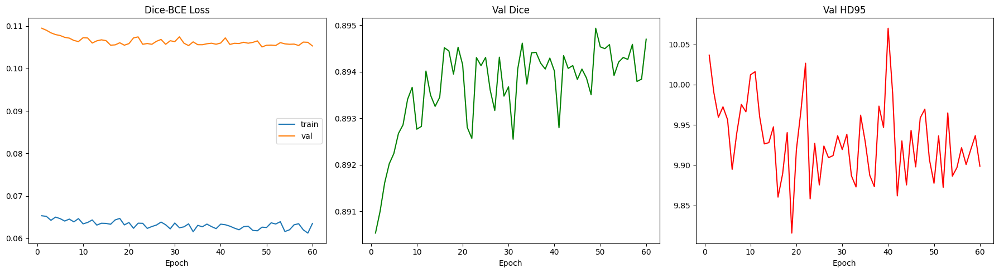

In [38]:
# ════════════════════════════════════════════════════════════════════════════
# 3DBREASTNET — ANATOMICAL VOXEL RECONSTRUCTION FINE-TUNING PIPELINE (GPU)
# ════════════════════════════════════════════════════════════════════════════

import os, sys, time, random, json, math
import numpy as np, cv2, tifffile, pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from dataclasses import dataclass
from typing import List, Dict
from tqdm.notebook import tqdm

import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import scipy.ndimage

# ── 1. CONFIGS ──────────────────────────────────────────────────────────────
CFG_FT = {
    "epochs":       60,                 
    "batch_size":   2,
    "lr":           2e-5,               
    "betas":        (0.5, 0.9),
    "n_per_view":   2,
    "seed":         42,
    "patience":     20,
    "ckpt_dir":     "checkpoints_3d_finetunedv2",
    "unet_ckpt":    r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/breast_segmentation_unet_best_gpu.pth",
    "base_ckpt":    r"checkpoints_3d/3dbreastnet_best.pth",
    "tiff_base":    r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient",
}

# ── 2. DATA LOADING UTILITIES ────────────────────────────────────────────────
@dataclass
class PatientGroup:
    patient_id: str
    label: str
    views: Dict[str, Path]

def get_view_key(filename):
    n = filename.lower()
    if "right later" in n: return "RL"
    if "right obli"  in n: return "RO"
    if "frontal" in n or "anterior" in n: return "F"
    if "left obliq"  in n: return "LO"
    if "left later"  in n: return "LL"
    return None

def build_patient_groups(tiff_base):
    tb = Path(tiff_base)
    pd_ = {}
    for tp in tb.rglob("*.tiff"):
        parts = tp.relative_to(tb).parts
        if len(parts) < 3: continue
        pid, lab, fn = parts[0], parts[1], parts[-1]
        vk = get_view_key(fn)
        if not vk: continue
        key = (pid, lab)
        if key not in pd_: pd_[key] = {"views": {}}
        pd_[key]["views"][vk] = tp
    groups, skip, nb_, nm = [], 0, 0, 0
    for (pid, lab), d in pd_.items():
        if len(d["views"]) == 5:
            groups.append(PatientGroup(pid, lab, d["views"]))
            nb_ += lab.lower() == "benign"; nm += lab.lower() != "benign"
        else:
            skip += 1
    groups.sort(key=lambda g: g.patient_id)
    print(f"Patients: {len(pd_)} | Complete: {len(groups)} | "
          f"Skipped: {skip} | B={nb_} M={nm}")
    return groups

class PatientDataset(Dataset):
    def __init__(self, groups, unet, device, img_sz=256):
        self.groups, self.unet, self.device = groups, unet, device
        self.img_sz = img_sz
        self.views = ["RL","RO","F","LO","LL"]
    def __len__(self): return len(self.groups)
    def __getitem__(self, idx):
        g = self.groups[idx]; thermals, masks = [], []
        for v in self.views:
            raw = tifffile.imread(str(g.views[v])).astype(np.float32)
            raw = cv2.resize(raw, (self.img_sz, self.img_sz))
            mn, mx = raw.min(), raw.max()
            norm = (raw - mn) / (mx - mn + 1e-8)
            thermals.append(norm)
            with torch.no_grad():
                inp = torch.tensor(norm).unsqueeze(0).unsqueeze(0).to(self.device)
                m = torch.sigmoid(self.unet(inp)).squeeze().cpu().numpy()
            m_smooth = cv2.GaussianBlur(m, (5, 5), 0)
            m_resized = cv2.resize(m_smooth, (128,128), interpolation=cv2.INTER_LINEAR)
            masks.append(m_resized)
        return {
            "masks_5ch": torch.tensor(np.stack(masks), dtype=torch.float32),
            "thermals_5ch": torch.tensor(np.stack(thermals), dtype=torch.float32),
            "patient_id": g.patient_id, "label": g.label,
        }

# ── 3. METRIC & LOSS FUNCTIONS ───────────────────────────────────────────────
def hd95(p, t):
    if p.sum()==0 or t.sum()==0: return 128.0
    pe = p ^ scipy.ndimage.binary_erosion(p)
    te = t ^ scipy.ndimage.binary_erosion(t)
    dtp = scipy.ndimage.distance_transform_edt(~pe)
    dtt = scipy.ndimage.distance_transform_edt(~te)
    d1 = np.percentile(dtt[pe], 95) if pe.sum()>0 else 128.0
    d2 = np.percentile(dtp[te], 95) if te.sum()>0 else 128.0
    return max(d1, d2)

# 2D Projection-Based Silhouette Loss (BCE + Dice)
def silhouette_loss(pred, target):
    dl = dice_loss(pred, target)
    pred_clamped = torch.clamp(pred.float(), min=1e-7, max=1.0 - 1e-7)
    bce = F.binary_cross_entropy(pred_clamped, target.float())
    return dl + 0.15 * bce

# 3D Spatial Smoothness Loss (Eliminates boundary blur/ghosting)
def total_variation_3d(vol):
    dx = torch.abs(vol[:, :, 1:, :, :] - vol[:, :, :-1, :, :]).mean()
    dy = torch.abs(vol[:, :, :, 1:, :] - vol[:, :, :, :-1, :]).mean()
    dz = torch.abs(vol[:, :, :, :, 1:] - vol[:, :, :, :, :-1]).mean()
    return dx + dy + dz

# 3D Inter-Mammary Valley cleft prior (Forces organ separation over the sternum)
def inter_mammary_valley_loss(vol):
    W = vol.shape[-1]
    mid = W // 2
    valley_region = vol[:, :, :, :, mid-4:mid+4]
    return valley_region.mean()

# 3D Volume L1 Sparsity penalty (Prevents conjoined visual hull bloating)
def sparsity_loss(vol):
    return torch.mean(torch.abs(vol))

# ── 4. FINE-TUNING LOOP EXECUTION ────────────────────────────────────────────
def fine_tune_reconstructor(cfg):
    torch.manual_seed(cfg["seed"]); np.random.seed(cfg["seed"])
    torch.cuda.manual_seed_all(cfg["seed"])
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Fine-tuning on device: {device}")

    # Load Frozen Segmentor
    unet = UNet().to(device)
    if Path(cfg["unet_ckpt"]).exists():
        unet.load_state_dict(torch.load(cfg["unet_ckpt"], map_location=device, weights_only=False))
    unet.eval()
    for p in unet.parameters(): p.requires_grad = False

    groups = build_patient_groups(cfg["tiff_base"])
    rng = random.Random(cfg["seed"])
    ben = [g for g in groups if g.label.lower() == "benign"]
    mal = [g for g in groups if g.label.lower() != "benign"]
    rng.shuffle(ben); rng.shuffle(mal)
    s = 0.78
    trn = ben[:int(len(ben)*s)] + mal[:int(len(mal)*s)]
    val = ben[int(len(ben)*s):] + mal[int(len(mal)*s):]
    print(f"Train: {len(trn)} | Val: {len(val)}")

    trn_dl = DataLoader(PatientDataset(trn, unet, device),
                        batch_size=cfg["batch_size"], shuffle=True, drop_last=True)
    val_dl = DataLoader(PatientDataset(val, unet, device),
                        batch_size=cfg["batch_size"], shuffle=False)

    # UPDATED: Initialize Unified V6 Model
    model = BreastNet3D_UNet().to(device)
    
    # Load the baseline pre-trained weights
    best_dice = 0.0
    base_ckpt = Path(cfg["base_ckpt"])
    if base_ckpt.exists():
        print(f" Loading baseline model weights from: {base_ckpt}")
        checkpoint = torch.load(base_ckpt, map_location=device, weights_only=False)
        model.load_state_dict(checkpoint["model"])
        best_dice = checkpoint.get("best_dice", 0.8300)
        print(f" Model loaded successfully! Initial Best Dice: {best_dice:.4f}")
    else:
        print(" WARNING: Pre-trained baseline checkpoint not found. Starting from scratch.")

    opt = torch.optim.Adam(model.parameters(), lr=cfg["lr"], betas=cfg["betas"])
    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(
        opt, mode="max", factor=0.5, patience=10, min_lr=1e-6)
    scaler = torch.amp.GradScaler("cuda", enabled=torch.cuda.is_available())
    Path(cfg["ckpt_dir"]).mkdir(parents=True, exist_ok=True)

    no_imp = 0
    hist = {"epoch":[], "train_loss":[], "val_loss":[], "val_dice":[], "val_hd":[]}
    val_angles = [-90., -45., 0., 45., 90.]

    print("\n Starting high-fidelity voxel grid fine-tuning...")
    for epoch in range(1, cfg["epochs"]+1):
        t0 = time.time()
        
        # ── train ──
        model.train()
        ep_loss = 0.0
        pbar = tqdm(trn_dl, desc=f"FT Epoch {epoch:03d} train", leave=False)
        for batch in pbar:
            m5 = batch["masks_5ch"].to(device)
            B = m5.size(0)
            opt.zero_grad(set_to_none=True)
            
            with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
                vol = model(m5)
            
            vol = vol.float()
            proj_loss = torch.tensor(0.0, device=device)
            
            for i in range(5):
                lo, hi = VIEW_WINDOWS[i]
                for _ in range(cfg["n_per_view"]):
                    th = torch.rand(B, device=device)*(hi-lo)+lo
                    proj = render_projection(vol, th)
                    proj_loss = proj_loss + 0.5 * silhouette_loss(proj, m5[:, i:i+1])
                
                th_canonical = torch.full((B,), val_angles[i], device=device)
                proj_canonical = render_projection(vol, th_canonical)
                proj_loss = proj_loss + 0.5 * silhouette_loss(proj_canonical, m5[:, i:i+1])

            proj_loss = proj_loss / (5 * (cfg["n_per_view"] + 1))
            
            loss_tv = total_variation_3d(vol)
            loss_valley = inter_mammary_valley_loss(vol)
            loss_sparsity = sparsity_loss(vol)
            
            total_loss = (
                proj_loss 
                + 0.10 * loss_tv         
                + 0.08 * loss_valley     
                + 0.002 * loss_sparsity   
            )
            
            scaler.scale(total_loss).backward()
            scaler.unscale_(opt)
            if torch.isfinite(total_loss):
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                scaler.step(opt)
            scaler.update()
            
            opt.zero_grad(set_to_none=True)
            ep_loss += total_loss.item() if torch.isfinite(total_loss) else 0.0
            
        ep_loss /= max(len(trn_dl), 1)

        # ── val ──
        model.eval()
        vl, vd, vh, cnt = 0., 0., 0., 0
        with torch.no_grad():
            for batch in tqdm(val_dl, desc=f"FT Epoch {epoch:03d} val", leave=False):
                m5 = batch["masks_5ch"].to(device); B = m5.size(0)
                with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
                    vol = model(m5)
                
                vol = vol.float()
                for i in range(5):
                    th = torch.full((B,), val_angles[i], device=device)
                    proj = render_projection(vol, th)
                    dl = dice_loss(proj, m5[:, i:i+1])
                    vl += dl.item(); vd += (1-dl).item()
                    pb = (proj>0.5).cpu().numpy()
                    mb = (m5[:, i:i+1]>0.5).cpu().numpy()
                    for b in range(B): vh += hd95(pb[b,0], mb[b,0]); cnt += 1
                    
        vl /= max(len(val_dl)*5, 1); vd /= max(len(val_dl)*5, 1)
        vh /= max(cnt, 1)
        elapsed = time.time() - t0

        hist["epoch"].append(epoch); hist["train_loss"].append(ep_loss)
        hist["val_loss"].append(vl); hist["val_dice"].append(vd); hist["val_hd"].append(vh)
        sched.step(vd)

        lr_now = opt.param_groups[0]["lr"]
        print(f"E{epoch:03d} | loss={ep_loss:.4f} | vl={vl:.4f} vd={vd:.4f} hd={vh:.2f} | lr={lr_now:.6f} | {elapsed:.1f}s")

        ckpt = {"epoch": epoch, "model": model.state_dict(),
                "opt": opt.state_dict(), "best_dice": max(best_dice, vd),
                "cfg": cfg, "hist": hist}
        
        torch.save(ckpt, Path(cfg["ckpt_dir"]) / "3dbreastnet_finetunedv2_last.pth")
        if vd > best_dice:
            best_dice = vd; no_imp = 0
            torch.save(ckpt, Path(cfg["ckpt_dir"]) / "3dbreastnet_finetunedv2_best.pth")
            print(f"  ★ New best fine-tuned reconstruction dice={best_dice:.4f}! Weights saved.")
        else:
            no_imp += 1
            if no_imp >= cfg["patience"]:
                print(f"Early stopping fine-tuning @ epoch {epoch}"); break

    # Plot and save progress
    fig, ax = plt.subplots(1, 3, figsize=(18, 5))
    ax[0].plot(hist["epoch"], hist["train_loss"], label="train"); ax[0].plot(hist["epoch"], hist["val_loss"], label="val")
    ax[0].set_title("Dice-BCE Loss"); ax[0].legend()
    ax[1].plot(hist["epoch"], hist["val_dice"], color="green"); ax[1].set_title("Val Dice")
    ax[2].plot(hist["epoch"], hist["val_hd"], color="red"); ax[2].set_title("Val HD95")
    for a in ax: a.set_xlabel("Epoch")
    plt.tight_layout(); plt.savefig(Path(cfg["ckpt_dir"]) / "fine_tuning_historyv2.png", dpi=150)
    print(f"Plots saved to '{cfg['ckpt_dir']}/fine_tuning_historyv2.png'. Best Dice={best_dice:.4f}")

# Run fine-tuning on default GPU
fine_tune_reconstructor(CFG_FT)


Running diagnostics on device: cuda



Patients: 137 | Complete: 122 | Skipped: 15 | B=96 M=26
Loading fine-tuned model checkpoint from: checkpoints_3d_finetunedv2/3dbreastnet_finetunedv2_best.pth


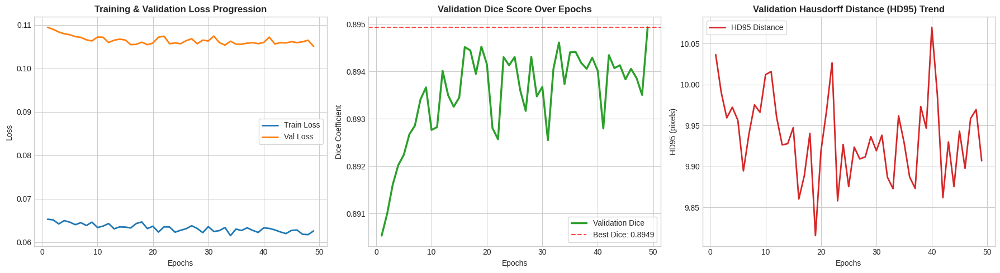

Evaluating Validation Split:   0%|          | 0/28 [00:00<?, ?it/s]


════════════════════════════════════════════════════════════════════════
           DETAILED RECONSTRUCTION METRICS BY ACQUISITION ANGLE
════════════════════════════════════════════════════════════════════════
View Name                      | Mean Dice Score      | Mean HD95 (pixels)  
----------------------------------------------------------------------------
Right Lateral (RL) at -90°     | 0.7926               | 14.22               
Right Oblique (RO) at -45°     | 0.9114               | 7.95                
Frontal (F) at 0°              | 0.9596               | 5.48                
Left Oblique (LO) at +45°      | 0.9142               | 10.24               
Left Lateral (LL) at +90°      | 0.8539               | 11.64               
════════════════════════════════════════════════════════════════════════

 Generating side-by-side validation visual audits...


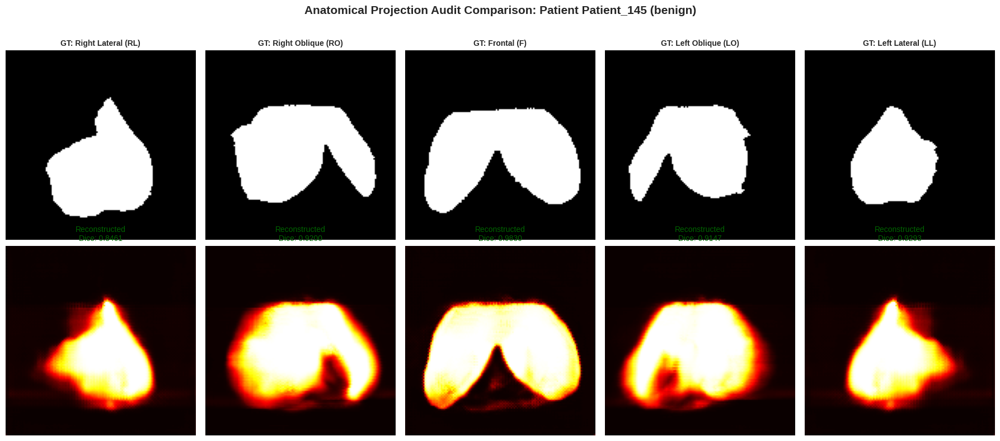

In [40]:
# ════════════════════════════════════════════════════════════════════════════
# 3DBREASTNET — POST-FINE-TUNING EVALUATION & VISUAL DASHBOARD (DEFAULT GPU)
# ════════════════════════════════════════════════════════════════════════════

import os, sys, time, random
import numpy as np, cv2, matplotlib.pyplot as plt
from pathlib import Path
import torch
from torch.utils.data import DataLoader

# 1. Config for Evaluation
EVAL_CFG = {
    "ckpt_dir":     "checkpoints_3d_finetunedv2",
    "best_ckpt":    r"checkpoints_3d_finetunedv2/3dbreastnet_finetunedv2_best.pth",
    "unet_ckpt":    r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/breast_segmentation_unet_best_gpu.pth",
    "tiff_base":    r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient",
    "seed":         42,
}

def run_visual_diagnostics(cfg):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Running diagnostics on device: {device}\n")

    # Load frozen segmentor
    unet = UNet().to(device)
    if Path(cfg["unet_ckpt"]).exists():
        unet.load_state_dict(torch.load(cfg["unet_ckpt"], map_location=device, weights_only=False))
    unet.eval()

    # Load validation data split deterministically
    groups = build_patient_groups(cfg["tiff_base"])
    rng = random.Random(cfg["seed"])
    ben = [g for g in groups if g.label.lower() == "benign"]
    mal = [g for g in groups if g.label.lower() != "benign"]
    rng.shuffle(ben); rng.shuffle(mal)
    s = 0.78
    val_groups = ben[int(len(ben)*s):] + mal[int(len(mal)*s):]
    
    val_dl = DataLoader(PatientDataset(val_groups, unet, device), batch_size=1, shuffle=False)

    # UPDATED: Initialize and load best fine-tuned V6 weights
    model = BreastNet3D_UNet().to(device)
    
    ckpt_path = Path(cfg["best_ckpt"])
    if not ckpt_path.exists():
        raise FileNotFoundError(f"Fine-tuned checkpoint not found at {ckpt_path}!")
        
    print(f"Loading fine-tuned model checkpoint from: {ckpt_path}")
    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    
    # Load the unified model dictionary
    model.load_state_dict(ckpt["model"])
    model.eval()

    # ════════════════════════════════════════════════════════════════════════
    # PART 1: PLOT TRAINING HISTORY (Loss, Val Dice, Val HD95)
    # ════════════════════════════════════════════════════════════════════════
    if "hist" in ckpt:
        hist = ckpt["hist"]
        epochs = hist["epoch"]
        
        plt.style.use('seaborn-v0_8-whitegrid' if 'seaborn-v0_8-whitegrid' in plt.style.available else 'default')
        fig, ax = plt.subplots(1, 3, figsize=(18, 5))
        
        # 1. Dice-BCE Loss
        ax[0].plot(epochs, hist["train_loss"], label="Train Loss", color="#1f77b4", linewidth=2)
        ax[0].plot(epochs, hist["val_loss"], label="Val Loss", color="#ff7f0e", linewidth=2)
        ax[0].set_title("Training & Validation Loss Progression", fontsize=12, fontweight='bold')
        ax[0].set_xlabel("Epochs", fontsize=10)
        ax[0].set_ylabel("Loss", fontsize=10)
        ax[0].legend(frameon=True)
        
        # 2. Validation Dice
        ax[1].plot(epochs, hist["val_dice"], color="#2ca02c", linewidth=2.5, label="Validation Dice")
        ax[1].axhline(y=max(hist["val_dice"]), color="r", linestyle="--", alpha=0.7, 
                     label=f"Best Dice: {max(hist['val_dice']):.4f}")
        ax[1].set_title("Validation Dice Score Over Epochs", fontsize=12, fontweight='bold')
        ax[1].set_xlabel("Epochs", fontsize=10)
        ax[1].set_ylabel("Dice Coefficient", fontsize=10)
        ax[1].legend(frameon=True)
        
        # 3. Validation HD95
        if "val_hd" in hist and len(hist["val_hd"]) > 0:
            ax[2].plot(epochs, hist["val_hd"], color="#d62728", linewidth=2, label="HD95 Distance")
            ax[2].set_title("Validation Hausdorff Distance (HD95) Trend", fontsize=12, fontweight='bold')
            ax[2].set_xlabel("Epochs", fontsize=10)
            ax[2].set_ylabel("HD95 (pixels)", fontsize=10)
            ax[2].legend(frameon=True)
        
        plt.tight_layout()
        plt.show()
    else:
        print("Training history not found in checkpoint file.")

    # ════════════════════════════════════════════════════════════════════════
    # PART 2: COMPUTE DETAILED PER-VIEW PERFORMANCE METRICS
    # ════════════════════════════════════════════════════════════════════════
    val_angles = [-90., -45., 0., 45., 90.]
    view_names = [
        "Right Lateral (RL) at -90°", 
        "Right Oblique (RO) at -45°", 
        "Frontal (F) at 0°", 
        "Left Oblique (LO) at +45°", 
        "Left Lateral (LL) at +90°"
    ]
    
    # Track metrics for each angle individually
    angle_dices = {ang: [] for ang in val_angles}
    angle_hds = {ang: [] for ang in val_angles}
    
    with torch.no_grad():
        for batch in tqdm(val_dl, desc="Evaluating Validation Split"):
            m5 = batch["masks_5ch"].to(device)
            B = m5.size(0)
            
            with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
                vol = model(m5).float()
            
            for i, ang in enumerate(val_angles):
                th = torch.full((B,), ang, device=device)
                proj = render_projection(vol, th)
                
                # Dice
                dl = dice_loss(proj, m5[:, i:i+1])
                dice_score = 1.0 - dl.item()
                angle_dices[ang].append(dice_score)
                
                # HD95
                pb = (proj > 0.5).cpu().numpy()
                mb = (m5[:, i:i+1] > 0.5).cpu().numpy()
                for b in range(B):
                    hd_score = hd95(pb[b,0], mb[b,0])
                    angle_hds[ang].append(hd_score)

    print("\n════════════════════════════════════════════════════════════════════════")
    print("           DETAILED RECONSTRUCTION METRICS BY ACQUISITION ANGLE")
    print("════════════════════════════════════════════════════════════════════════")
    print(f"{'View Name':<30} | {'Mean Dice Score':<20} | {'Mean HD95 (pixels)':<20}")
    print("-" * 76)
    for i, ang in enumerate(val_angles):
        mean_d = np.mean(angle_dices[ang])
        mean_h = np.mean(angle_hds[ang])
        print(f"{view_names[i]:<30} | {mean_d:<20.4f} | {mean_h:<20.2f}")
    print("════════════════════════════════════════════════════════════════════════\n")

    # ════════════════════════════════════════════════════════════════════════
    # PART 3: VISUAL SIDE-BY-SIDE PROJECTION AUDIT
    # ════════════════════════════════════════════════════════════════════════
    print(" Generating side-by-side validation visual audits...")
    sample_batch = next(iter(val_dl))
    m5_sample = sample_batch["masks_5ch"].to(device)
    pid_sample = sample_batch["patient_id"][0]
    label_sample = sample_batch["label"][0]
    
    with torch.no_grad():
        with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            vol_sample = model(m5_sample).float()
        
    fig, axes = plt.subplots(2, 5, figsize=(18, 8))
    fig.suptitle(f"Anatomical Projection Audit Comparison: Patient {pid_sample} ({label_sample})", 
                 fontsize=15, fontweight='bold', y=0.98)
    
    for i, ang in enumerate(val_angles):
        # Ground Truth Mask
        gt_mask = m5_sample[0, i].cpu().numpy()
        axes[0, i].imshow(gt_mask, cmap='gray')
        axes[0, i].set_title(f"GT: {view_names[i].split(' at ')[0]}", fontsize=10, fontweight='bold')
        axes[0, i].axis('off')
        
        # Raymarched Predicted Projection
        th = torch.full((1,), ang, device=device)
        with torch.no_grad():
            proj_sample = render_projection(vol_sample, th).squeeze().cpu().numpy()
            
        axes[1, i].imshow(proj_sample, cmap='hot')
        
        # Calculate individual Dice score
        intersect = np.sum((proj_sample > 0.5) * (gt_mask > 0.5))
        denom = np.sum(proj_sample > 0.5) + np.sum(gt_mask > 0.5)
        ind_dice = (2.0 * intersect + 1e-6) / (denom + 1e-6)
        
        axes[1, i].set_title(f"Reconstructed\nDice: {ind_dice:.4f}", fontsize=10, color='darkgreen' if ind_dice > 0.8 else 'darkred')
        axes[1, i].axis('off')
        
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()

# Run the diagnostics cell on default GPU
run_visual_diagnostics(EVAL_CFG)

## Post-Training 3D Visualization (Local Laptop)
Run this cell to perform inference using explicit local Windows paths.

In [53]:
# ════════════════════════════════════════════════════════════════
# 3D VISUALIZATION OF RANDOM PATIENTS (LAPTOP LOCAL) - UPRIGHT
# ════════════════════════════════════════════════════════════════
import random
import io
from IPython.display import display, Image
import torch
from pathlib import Path
from skimage.measure import marching_cubes
from scipy.ndimage import gaussian_filter
import plotly.graph_objects as go

def visualize_random_patients_local(n=5):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    # Updated Paths to point to your new fine-tuned weights!
    unet_ckpt = r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/breast_segmentation_unet_best_gpu.pth"
    tiff_base = r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient"
    ckpt_path = Path(r"checkpoints_3d_finetunedv2/3dbreastnet_finetunedv2_best.pth")
    
    if not ckpt_path.exists():
        print(f"Error: No trained model found at {ckpt_path}.")
        return
        
    print("Loading checkpoints...")
    
    unet = UNet().to(device)
    if Path(unet_ckpt).exists():
        unet.load_state_dict(torch.load(unet_ckpt, map_location=device, weights_only=False))
    unet.eval()
    
    # UPDATED: Load Unified V6 Architecture
    model = BreastNet3D_UNet().to(device)
    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    
    # Load model weights safely
    if "model" in ckpt:
        model.load_state_dict(ckpt["model"])
    elif "enc" in ckpt:
        print("Warning: Found legacy V5 weights, attempting to load...")
        model.load_state_dict(ckpt["enc"], strict=False)
    model.eval()
    
    print(f"Loading patient list from {tiff_base}...")
    groups = build_patient_groups(tiff_base)
    if len(groups) == 0: 
        print("No patients found. Check dataset path.")
        return
    
    selected = random.sample(groups, min(n, len(groups)))
    dataset = PatientDataset(selected, unet, device)
    
    print(f"Generating 3D models for {len(selected)} patients...")
    
    for i in range(len(dataset)):
        item = dataset[i]
        pid, label = item["patient_id"], item["label"]
        m5 = item["masks_5ch"].unsqueeze(0).to(device)
        
        with torch.no_grad(), torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            # UPDATED: Unified forward pass
            vol = model(m5).float()
            
        vol_np = vol[0, 0].cpu().numpy()
        
        # Apply the Connected Components Cleaner to wipe out floating artifacts!
        vol_np = remove_floating_residuals(vol_np, threshold=0.5)
        
        # Smooth for better mesh extraction
        vol_np = gaussian_filter(vol_np, sigma=5)  
        
        try:
            verts, faces, normals, values = marching_cubes(vol_np, level=0.001)
            
            fig = go.Figure(data=[
                go.Mesh3d(
                    # SWAPPED AXES to make the patient stand upright!
                    x=verts[:, 2],     # Width mapped to X (left/right)
                    y=verts[:, 0],     # Depth mapped to Y (front/back)
                    z=-verts[:, 1],    # Height mapped to Z (inverted so head points up)
                    
                    i=faces[:, 0], j=faces[:, 1], k=faces[:, 2],
                    colorscale='Hot',
                    intensity=-verts[:, 1],  # Apply heat gradient vertically
                    showscale=False
                )
            ])
            
            # Lock the camera ratio so it doesn't squish the breasts
            fig.update_layout(
                title=f"Patient: {pid} | Label: {label} (3D Reconstruction)",
                scene=dict(
                    xaxis_title='Width (X)', 
                    yaxis_title='Depth (Y)', 
                    zaxis_title='Height (Z)',
                    aspectmode='data',
                    camera=dict(
                        up=dict(x=0, y=0, z=1),         # Ensure Z is up
                        eye=dict(x=0, y=1.5, z=0.2)     # Look from the front
                    )
                ),
                margin=dict(l=0, r=0, b=0, t=40)
            )

            fig.show()
        except ValueError:
            print(f"Could not generate 3D mesh for {pid} (volume might be empty).")

# Run it!
visualize_random_patients_local(n=5)

Using device: cuda
Loading checkpoints...
Loading patient list from /mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient...
Patients: 137 | Complete: 122 | Skipped: 15 | B=96 M=26
Generating 3D models for 5 patients...


### Thermal Overlay

In [33]:
# ════════════════════════════════════════════════════════════════════════════
# 3D THERMAL OVERLAY (LAMBERTIAN WEIGHTED FUSION FOR IPBHE)
# ════════════════════════════════════════════════════════════════════════════

import random
import math
import numpy as np
import cv2
import tifffile
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from pathlib import Path
from dataclasses import dataclass
from typing import Dict
from skimage.measure import marching_cubes
from scipy.ndimage import gaussian_filter, map_coordinates, binary_dilation
import plotly.graph_objects as go

from scipy.ndimage import map_coordinates, distance_transform_edt

# ── 1. MODEL ARCHITECTURES (EMBEDDED FOR STANDALONE EXECUTION) ───────────────
class DoubleConv2D(nn.Module):
    def __init__(self, inc, outc, drop=0.2):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(inc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True),
            nn.Dropout2d(drop) if drop > 0 else nn.Identity(),
            nn.Conv2d(outc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True))
    def forward(self, x): return self.block(x)

class DoubleConv3D(nn.Module):
    def __init__(self, inc, outc, drop=0.2):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv3d(inc, outc, 3, padding=1, bias=False),
            nn.BatchNorm3d(outc), nn.ReLU(True),
            nn.Dropout3d(drop) if drop > 0 else nn.Identity(),
            nn.Conv3d(outc, outc, 3, padding=1, bias=False),
            nn.BatchNorm3d(outc), nn.ReLU(True))
    def forward(self, x): return self.block(x)

def _init(m):
    if isinstance(m, (nn.Conv2d, nn.Conv3d, nn.ConvTranspose2d, nn.ConvTranspose3d)):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None: nn.init.constant_(m.bias, 0)
    elif isinstance(m, (nn.BatchNorm2d, nn.BatchNorm3d)):
        nn.init.constant_(m.weight, 1); nn.init.constant_(m.bias, 0)
    elif isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None: nn.init.constant_(m.bias, 0)

class DoubleConv(nn.Module):
    def __init__(self, inc, outc, drop=0.0):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(inc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True),
            nn.Conv2d(outc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True),
            nn.Dropout2d(drop) if drop > 0 else nn.Identity())
    def forward(self, x): return self.block(x)

class UNet(nn.Module):
    def __init__(self, in_c=1, out_c=1, b=64, drop=0.2):
        super().__init__()
        self.pool = nn.MaxPool2d(2)
        self.enc1 = DoubleConv(in_c, b, 0.0)
        self.enc2 = DoubleConv(b, b*2, 0.0)
        self.enc3 = DoubleConv(b*2, b*4, 0.1)
        self.enc4 = DoubleConv(b*4, b*8, 0.1)
        self.bottleneck = DoubleConv(b*8, b*16, drop)
        self.up4 = nn.ConvTranspose2d(b*16, b*8, 2, stride=2)
        self.dec4 = DoubleConv(b*16, b*8, 0.1)
        self.up3 = nn.ConvTranspose2d(b*8, b*4, 2, stride=2)
        self.dec3 = DoubleConv(b*8, b*4, 0.1)
        self.up2 = nn.ConvTranspose2d(b*4, b*2, 2, stride=2)
        self.dec2 = DoubleConv(b*4, b*2, 0.0)
        self.up1 = nn.ConvTranspose2d(b*2, b, 2, stride=2)
        self.dec1 = DoubleConv(b*2, b, 0.0)
        self.out = nn.Conv2d(b, out_c, 1)
    def forward(self, x):
        e1=self.enc1(x); e2=self.enc2(self.pool(e1))
        e3=self.enc3(self.pool(e2)); e4=self.enc4(self.pool(e3))
        b=self.bottleneck(self.pool(e4))
        d4=self.dec4(torch.cat([self.up4(b),e4],1))
        d3=self.dec3(torch.cat([self.up3(d4),e3],1))
        d2=self.dec2(torch.cat([self.up2(d3),e2],1))
        d1=self.dec1(torch.cat([self.up1(d2),e1],1))
        return self.out(d1)

class Encoder2D(nn.Module):
    def __init__(self, drop=0.25):
        super().__init__()
        self.pool = nn.MaxPool2d(2)
        self.enc1 = DoubleConv2D(5, 32, 0)
        self.enc2 = DoubleConv2D(32, 64, 0)
        self.enc3 = DoubleConv2D(64, 128, drop)
        self.enc4 = DoubleConv2D(128, 256, drop)
        self.enc5 = DoubleConv2D(256, 512, drop)
        self.enc6 = DoubleConv2D(512, 512, drop)
        self.fc = nn.Sequential(nn.Dropout(drop), nn.Linear(512*2*2, 1000))
        self.apply(_init)
    def forward(self, x):
        for enc in [self.enc1, self.enc2, self.enc3, self.enc4, self.enc5, self.enc6]:
            x = enc(x); x = self.pool(x)
        return self.fc(x.view(x.size(0), -1))

class Decoder3D(nn.Module):
    def __init__(self, drop=0.25):
        super().__init__()
        self.fc = nn.Linear(1000, 512*2*2*2)
        self.up1=nn.ConvTranspose3d(512,256,2,stride=2); self.d1=DoubleConv3D(256,256,drop)
        self.up2=nn.ConvTranspose3d(256,128,2,stride=2); self.d2=DoubleConv3D(128,128,drop)
        self.up3=nn.ConvTranspose3d(128,64,2,stride=2);  self.d3=DoubleConv3D(64,64,drop)
        self.up4=nn.ConvTranspose3d(64,32,2,stride=2);   self.d4=DoubleConv3D(32,32,0)
        self.up5=nn.ConvTranspose3d(32,16,2,stride=2);   self.d5=DoubleConv3D(16,16,0)
        self.up6=nn.ConvTranspose3d(16,8,2,stride=2);    self.d6=DoubleConv3D(8,8,0)
        self.out = nn.Sequential(nn.Conv3d(8,1,1), nn.Sigmoid())
        self.apply(_init)
        nn.init.constant_(self.out[0].bias, -4.0)

    def _s4(self, x): return self.d4(self.up4(x))
    def _s5(self, x): return self.d5(self.up5(x))
    def _s6(self, x): return self.d6(self.up6(x))

    def forward(self, x):
        x = self.fc(x).view(x.size(0), 512, 2, 2, 2)
        x = self.d1(self.up1(x))
        x = self.d2(self.up2(x))
        x = self.d3(self.up3(x))
        if x.requires_grad:
            x = torch.utils.checkpoint.checkpoint(self._s4, x, use_reentrant=False)
            x = torch.utils.checkpoint.checkpoint(self._s5, x, use_reentrant=False)
            x = torch.utils.checkpoint.checkpoint(self._s6, x, use_reentrant=False)
        else:
            x = self._s4(x); x = self._s5(x); x = self._s6(x)
        return self.out(x)

# ── 2. DATA UTILITIES ────────────────────────────────────────────────────────
@dataclass
class PatientGroup:
    patient_id: str
    label: str
    views: Dict[str, Path]

def get_view_key(filename):
    n = filename.lower()
    if "right later" in n: return "RL"
    if "right obli"  in n: return "RO"
    if "frontal" in n or "anterior" in n: return "F"
    if "left obliq"  in n: return "LO"
    if "left later"  in n: return "LL"
    return None

def build_patient_groups(tiff_base):
    tb = Path(tiff_base)
    pd_ = {}
    for tp in tb.rglob("*.tiff"):
        parts = tp.relative_to(tb).parts
        if len(parts) < 3: continue
        pid, lab, fn = parts[0], parts[1], parts[-1]
        vk = get_view_key(fn)
        if not vk: continue
        key = (pid, lab)
        if key not in pd_: pd_[key] = {"views": {}}
        pd_[key]["views"][vk] = tp
    groups = [PatientGroup(pid, lab, d["views"]) for (pid, lab), d in pd_.items() if len(d["views"]) == 5]
    groups.sort(key=lambda g: g.patient_id)
    return groups

class PatientDataset(Dataset):
    def __init__(self, groups, unet, device):
        self.groups, self.unet, self.device = groups, unet, device
        self.views = ["RL","RO","F","LO","LL"]
        
    def __len__(self): return len(self.groups)
    
    def __getitem__(self, idx):
        g = self.groups[idx]; thermals_128, masks_128 = [], []
        for v in self.views:
            raw = tifffile.imread(str(g.views[v])).astype(np.float32)
            raw_256 = cv2.resize(raw, (256, 256))
            
            # Normalize to [0, 1] to fix auto-exposure differences between the 5 views!
            mn, mx = raw_256.min(), raw_256.max()
            norm = (raw_256 - mn) / (mx - mn + 1e-8)
            
            with torch.no_grad():
                inp = torch.tensor(norm).unsqueeze(0).unsqueeze(0).to(self.device)
                m = torch.sigmoid(self.unet(inp)).squeeze().cpu().numpy()
            
            masks_128.append(cv2.resize(m, (128, 128), interpolation=cv2.INTER_NEAREST))
            
            # We must use the normalized image to ensure perfect camera blending!
            norm_128 = cv2.resize(norm, (128, 128), interpolation=cv2.INTER_LINEAR)
            thermals_128.append(norm_128)
            
        return {
            "masks_5ch": torch.tensor(np.stack(masks_128), dtype=torch.float32),
            "thermals_5ch": torch.tensor(np.stack(thermals_128), dtype=torch.float32),
            "patient_id": g.patient_id, "label": g.label,
        }

# ── 3. LAMBERTIAN WEIGHTED THERMAL FUSION FOR IPBHE ──────────────────────────
def compute_thermal_overlay(verts, normals, thermals_5ch, masks_5ch):
    intensities = np.zeros(len(verts))
    weight_sum = np.zeros(len(verts))
    
    w_in = verts[:, 2] - 63.5
    d_in = verts[:, 0] - 63.5
    h_in = verts[:, 1]
    
    outward_normals = -normals
    view_angles = [-90, -45, 0, 45, 90]
    
    for i, angle in enumerate(view_angles):
        rad = np.deg2rad(angle)
        c, s = np.cos(rad), np.sin(rad)
        
        cam_vec_w = -s
        cam_vec_d = -c
        
        # Exponential Weighting automatically isolates the best camera
        dot_prod = outward_normals[:, 2] * cam_vec_w + outward_normals[:, 0] * cam_vec_d
        weights = np.maximum(dot_prod + 0.3, 0.0) ** 12
        
        valid_idx = np.where(weights > 0)[0]
        if len(valid_idx) == 0: continue
        
        x_img = c * w_in[valid_idx] - s * d_in[valid_idx]
        x_coords = x_img + 63.5
        y_coords = h_in[valid_idx]
        
        thermal_img = thermals_5ch[0, i].cpu().numpy()
        
        # Smoothly sample the raw image (it naturally captures the patient's stomach/skin)
        sampled_thermals = map_coordinates(thermal_img, [y_coords, x_coords], order=1, mode='nearest')
        
        intensities[valid_idx] += sampled_thermals * weights[valid_idx]
        weight_sum[valid_idx] += weights[valid_idx]
        
    untextured = weight_sum == 0
    weight_sum[untextured] = 1.0  
    final_intensities = intensities / weight_sum
    
    # Frontal Fallback (In case the 3D reconstructor creates broken/inverted normals)
    if np.any(untextured):
        x_base = w_in[untextured] + 63.5
        y_base = h_in[untextured]
        thermal_base = thermals_5ch[0, 2].cpu().numpy() # Index 2 is Frontal
        base_thermals = map_coordinates(thermal_base, [y_base, x_base], order=1, mode='nearest')
        final_intensities[untextured] = base_thermals
        
    # NOTE: Chest wall clipping has been entirely removed! 
    # The network will now organically texture the deep chest wall without flat clipping errors.
    
    return final_intensities

# ── 4. VISUALIZATION EXECUTION ───────────────────────────────────────────────
def visualize_thermal_patients_local(n=3):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    unet_ckpt = r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/breast_segmentation_unet_best_gpu.pth"
    tiff_base = r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient"
    ckpt_path = Path(r"checkpoints_3d_finetuned/3dbreastnet_finetuned_best.pth")
    
    print("Loading models...")
    unet = UNet().to(device)
    unet.load_state_dict(torch.load(unet_ckpt, map_location=device, weights_only=False))
    unet.eval()
    
    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    enc = Encoder2D().to(device)
    dec = Decoder3D().to(device)
    enc.load_state_dict(ckpt["enc"])
    dec.load_state_dict(ckpt["dec"])
    enc.eval(); dec.eval()
    
    groups = build_patient_groups(tiff_base)
    selected = random.sample(groups, min(n, len(groups)))
    dataset = PatientDataset(selected, unet, device)
    
    for i in range(len(dataset)):
        item = dataset[i]
        pid, label = item["patient_id"], item["label"]
        m5 = item["masks_5ch"].unsqueeze(0).to(device)
        t5 = item["thermals_5ch"].unsqueeze(0).to(device)
        
        with torch.no_grad(), torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            vol = dec(enc(m5))
            
        vol_np = vol.float()[0, 0].cpu().numpy()
        vol_np = gaussian_filter(vol_np, sigma=2.0)
        
        try:
            verts, faces, normals, values = marching_cubes(vol_np, level=0.01)
            
            thermal_paint = compute_thermal_overlay(verts, normals, t5, m5)
            
            fig = go.Figure(data=[
                go.Mesh3d(
                    x=verts[:, 2], y=verts[:, 0], z=-verts[:, 1], 
                    i=faces[:, 0], j=faces[:, 1], k=faces[:, 2],
                    colorscale='Jet',          
                    intensity=thermal_paint,   
                    showscale=True,
                    colorbar_title="Thermal<br>Intensity"
                )
            ])
            
            fig.update_layout(
                title=f"Patient: {pid} | Label: {label} (3D Thermal Mesh)",
                scene=dict(
                    xaxis_title='Width (X)', yaxis_title='Depth (Y)', zaxis_title='Height (Z)',
                    aspectmode='data',
                    camera=dict(up=dict(x=0, y=0, z=1), eye=dict(x=0, y=1.5, z=0.2)) 
                ),
                margin=dict(l=0, r=0, b=0, t=40)
            )
            fig.show()
        except ValueError:
            print(f"Could not generate 3D mesh for {pid}")

visualize_thermal_patients_local(n=3)


Using device: cuda
Loading models...


## Export Geometry (.STL)
Run this cell to batch process **all available patients** through the network and export their 3D reconstructed geometries into universally readable `.stl` files. You can open these in Blender, MeshLab, or Windows 3D Viewer.

In [6]:
# ════════════════════════════════════════════════════════════════
import os
import struct
import torch
import numpy as np
from pathlib import Path
from tqdm.notebook import tqdm
from scipy.ndimage import binary_closing, binary_fill_holes, generate_binary_structure, label, gaussian_filter
from skimage.measure import marching_cubes

# NOTE: All classes (UNet, Encoder2D, Decoder3D, PatientDataset, build_patient_groups)
# are defined in earlier cells. Make sure to run those cells first.


def clean_volume_for_export(volume, threshold=0.35):
    """Convert the raw prediction into a closed binary volume before meshing."""
    mask = volume >= threshold
    structure = generate_binary_structure(3, 2)

    # Fill gaps and seal small openings so the exported mesh is watertight.
    mask = binary_closing(mask, structure=structure, iterations=1)
    mask = binary_fill_holes(mask)

    labeled, num = label(mask, structure=structure)
    if num > 1:
        sizes = np.bincount(labeled.ravel())
        sizes[0] = 0
        mask = labeled == sizes.argmax()

    # Pad one voxel so marching_cubes can build a closed outer shell.
    mask = np.pad(mask, 1, mode="constant", constant_values=False)
    return mask.astype(np.float32)


def save_stl(filename, verts, faces):
    """Writes a binary STL file natively without needing external libraries."""
    with open(filename, "wb") as f:
        # 80 byte header
        f.write(b"\0" * 80)
        # Number of triangles (uint32)
        f.write(struct.pack("<I", len(faces)))

        for face in faces:
            tri = verts[face].astype(np.float32, copy=False)
            v0, v1, v2 = tri
            normal = np.cross(v1 - v0, v2 - v0)
            norm = np.linalg.norm(normal)
            if norm > 0:
                normal = (normal / norm).astype(np.float32, copy=False)
            else:
                normal = np.zeros(3, dtype=np.float32)

            f.write(struct.pack("<3f", *normal))
            f.write(struct.pack("<3f", *v0))
            f.write(struct.pack("<3f", *v1))
            f.write(struct.pack("<3f", *v2))
            # Attribute byte count (uint16)
            f.write(struct.pack("<H", 0))


def export_all_patients_to_stl():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Setup Output Directory
    out_dir = Path("exported_stls")
    out_dir.mkdir(exist_ok=True)

    unet_ckpt = r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/breast_segmentation_unet_best_gpu.pth"
    tiff_base = r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient"
    ckpt_path = Path(r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/3DBreastnet/checkpoints_3d/3dbreastnet_best.pth")

    if not ckpt_path.exists():
        print(f"Error: No trained model found at {ckpt_path}.")
        return

    print("Loading checkpoints...")
    unet = UNet().to(device)
    unet.load_state_dict(torch.load(unet_ckpt, map_location=device, weights_only=False))
    unet.eval()

    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    enc = Encoder2D().to(device)
    dec = Decoder3D().to(device)
    enc.load_state_dict(ckpt["enc"])
    dec.load_state_dict(ckpt["dec"])
    enc.eval(); dec.eval()

    groups = build_patient_groups(tiff_base)
    if not groups:
        return

    dataset = PatientDataset(groups, unet, device)

    print(f"Batch exporting {len(dataset)} patients to .STL...")

    for i in tqdm(range(len(dataset))):
        item = dataset[i]
        pid = item["patient_id"]
        m5 = item["masks_5ch"].unsqueeze(0).to(device)

        with torch.no_grad(), torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            vol = dec(enc(m5)).float()
            
        vol_np = vol[0, 0].cpu().numpy()
        
        # 1. Pad the volume with 0s on all boundaries to force a closed, watertight solid!
        vol_np = np.pad(vol_np, pad_width=1, mode='constant', constant_values=0)
        
        # 2. Apply stronger Gaussian smoothing to eliminate the voxel staircasing (sigma=2.0)
        vol_np = gaussian_filter(vol_np, sigma=2.0)
        
        try:
            verts, faces, normals, _ = marching_cubes(vol_np, level=0.02)
            # 3. Shift vertices back by 1 to compensate for the padding
            verts = verts - 1.0
            
            # Scale coordinates relative to [-1, 1] for sane mesh sizes in external viewers
            verts = (verts / 63.5) - 1.0
            
            # Export
            export_path = out_dir / f"{pid}_3d_geometry.stl"
            save_stl(export_path, verts, faces)
        except Exception as e:
            print(f"Skipping {pid} due to error: {e}")

    print(f"\nSuccess! All meshes have been saved to the '{out_dir.absolute()}' directory.")


# Run the batch exporter
export_all_patients_to_stl()

Loading checkpoints...


NameError: name 'UNet' is not defined

## Test Single Patient STL Export
Run this cell to quickly generate and test the `.stl` output for a specific patient without batch processing the whole dataset.

In [ ]:
import struct
import torch
import numpy as np
from scipy.ndimage import gaussian_filter
from skimage.measure import marching_cubes

# NOTE: All classes (UNet, Encoder2D, Decoder3D, PatientDataset, build_patient_groups)
# are defined in earlier cells. Make sure to run those cells first.

def save_stl(filename, verts, faces, normals):
    with open(filename, "wb") as f:
        f.write(b"\0" * 80)
        f.write(struct.pack("<I", len(faces)))
        for face in faces:
            f.write(struct.pack("<3f", 0.0, 0.0, 0.0))
            f.write(struct.pack("<3f", *verts[face[0]]))
            f.write(struct.pack("<3f", *verts[face[1]]))
            f.write(struct.pack("<3f", *verts[face[2]]))
            f.write(struct.pack("<H", 0))

def export_all_patients_to_stl():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    out_dir = Path("exported_stls")
    out_dir.mkdir(exist_ok=True)
    
    unet_ckpt = r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/breast_segmentation_unet_best_gpu.pth"
    tiff_base = r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient"
    ckpt_path = Path(r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/3DBreastnet/checkpoints_3d/3dbreastnet_best.pth")
    
    if not ckpt_path.exists():
        print(f"Error: Checkpoint not found at {ckpt_path}.")
        return
        
    print("Loading checkpoints...")
    unet = UNet().to(device)
    unet.load_state_dict(torch.load(unet_ckpt, map_location=device, weights_only=False))
    unet.eval()
    
    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    enc = Encoder2D().to(device)
    dec = Decoder3D().to(device)
    enc.load_state_dict(ckpt["enc"])
    dec.load_state_dict(ckpt["dec"])
    enc.eval(); dec.eval()
    
    groups = build_patient_groups(tiff_base)
    if not groups:
        print("No complete patients found in the dataset.")
        return
        
    dataset = PatientDataset(groups, unet, device)
    print(f"Batch exporting {len(dataset)} patients to .STL...")
    
    for item in dataset:
        pid = item["patient_id"]
        m5 = item["masks_5ch"].unsqueeze(0).to(device)
        
        with torch.no_grad(), torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            vol = dec(enc(m5)).float()
            
        vol_np = vol[0, 0].cpu().numpy()
        vol_np = np.pad(vol_np, pad_width=1, mode='constant', constant_values=0)
        vol_np = gaussian_filter(vol_np, sigma=2.0)
        
        try:
            verts, faces, normals, _ = marching_cubes(vol_np, level=0.5)
            verts = verts - 1.0
            verts = (verts / 63.5) - 1.0
            
            export_path = out_dir / f"{pid}_3d_geometry.stl"
            save_stl(export_path, verts, faces, normals)
            print(f"Exported {pid} -> {export_path}")
        except Exception as e:
            print(f"Skipping {pid} due to error: {e}")

    print(f"\nSuccess! All meshes have been saved to the '{out_dir.absolute()}' directory.")

# Run the batch exporter
export_all_patients_to_stl()

Loading checkpoints...
  Skip Patient_384 (malignant): 4/5 views
  Skip Patient_23 (benign): 3/5 views
  Skip Patient_141 (benign): 4/5 views
  Skip Patient_109 (benign): 4/5 views
  Skip Patient_394 (malignant): 4/5 views
  Skip Patient_160 (benign): 4/5 views
  Skip Patient_163 (benign): 4/5 views
  Skip Patient_18 (benign): 2/5 views
  Skip Patient_104 (benign): 1/5 views
  Skip Patient_258 (malignant): 4/5 views
  Skip Patient_105 (benign): 1/5 views
  Skip Patient_189 (benign): 2/5 views
  Skip Patient_51 (benign): 4/5 views
  Skip Patient_243 (benign): 4/5 views
  Skip Patient_193 (benign): 2/5 views
Patients: 137 | Complete: 122 | Skipped: 15 | B=96 M=26
Batch exporting 122 patients to .STL...
Exported Patient_1 -> exported_stls/Patient_1_3d_geometry.stl
Exported Patient_10 -> exported_stls/Patient_10_3d_geometry.stl
Exported Patient_100 -> exported_stls/Patient_100_3d_geometry.stl
Exported Patient_106 -> exported_stls/Patient_106_3d_geometry.stl
Exported Patient_107 -> exported

## Per Patient Projection Validation on Each View

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.auto import tqdm

# Import model architectures and data loaders from your existing scripts
from models import UNet, Encoder2D, Decoder3D
from train import build_patient_groups, PatientDataset, dice_loss, render_projection

def evaluate_all_patients():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    # 1. Setup Directories
    out_dir = Path("projection_plots")
    out_dir.mkdir(exist_ok=True)
    
    # 2. Paths
    base_dir = Path("../..").resolve()
    unet_ckpt = base_dir / "UNET_Segmentation" / "breast_segmentation_unet_best_gpu.pth"
    tiff_base = base_dir / "data" / "organized_by_patient"
    ckpt_path = Path("checkpoints_3d/3dbreastnet_best.pth")
    
    # 3. Load Models
    print("Loading checkpoints...")
    unet = UNet().to(device)
    unet.load_state_dict(torch.load(unet_ckpt, map_location=device, weights_only=False))
    unet.eval()
    
    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    enc = Encoder2D().to(device)
    dec = Decoder3D().to(device)
    enc.load_state_dict(ckpt["enc"])
    dec.load_state_dict(ckpt["dec"])
    enc.eval(); dec.eval()
    
    # 4. Load Data
    groups = build_patient_groups(tiff_base)
    if not groups:
        print("No patients found.")
        return
    dataset = PatientDataset(groups, unet, device)
    
    # 5. Evaluation Loop
    view_angles = [-90.0, -45.0, 0.0, 45.0, 90.0]
    view_names = ["Right Lateral (-90°)", "Right Oblique (-45°)", "Frontal (0°)", "Left Oblique (45°)", "Left Lateral (90°)"]
    
    all_dices = []
    
    print(f"\nEvaluating {len(dataset)} patients and generating 2x5 plots...")
    
    for item in tqdm(dataset):
        pid = item["patient_id"]
        m5 = item["masks_5ch"].unsqueeze(0).to(device)  # Ground Truth 2D Silhouettes [1, 5, 128, 128]
        
        with torch.no_grad(), torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            # Generate 3D Volume
            vol = dec(enc(m5)).float()
            
            patient_dices = []
            projections = []
            
            # Render and Calculate Dice for the 5 standard angles
            for i, angle in enumerate(view_angles):
                th = torch.tensor([angle], device=device, dtype=torch.float32)
                proj = render_projection(vol, th)  # [1, 1, 128, 128]
                
                gt_mask = m5[:, i:i+1] # [1, 1, 128, 128]
                dl = dice_loss(proj, gt_mask)
                d_score = 1.0 - dl.item()
                
                patient_dices.append(d_score)
                # Binarize the projection at 0.5 threshold to see the sharp silhouette curves
                binary_proj = (proj[0, 0] > 0.5).cpu().numpy().astype(np.float32)
                projections.append(binary_proj)
        
        all_dices.append(np.mean(patient_dices))
        
        # 6. Generate 2x5 Grid Plot
        fig, axes = plt.subplots(2, 5, figsize=(20, 8))
        fig.suptitle(f"Patient: {pid} | Average Dice Score: {np.mean(patient_dices):.4f}", fontsize=16)
        
        for i in range(5):
            # Top Row: Ground Truth (U-Net mask)
            gt_img = m5[0, i].cpu().numpy()
            axes[0, i].imshow(gt_img, cmap='gray')
            axes[0, i].set_title(f"GT: {view_names[i]}")
            axes[0, i].axis('off')
            
            # Bottom Row: 3D Projected Silhouette
            axes[1, i].imshow(projections[i], cmap='gray')
            axes[1, i].set_title(f"Predicted Projection (Dice: {patient_dices[i]:.3f})")
            axes[1, i].axis('off')
            
        plt.tight_layout()
        plot_path = out_dir / f"{pid}_validation_grid.png"
        plt.savefig(plot_path, dpi=150)
        plt.close(fig)
        
    # 7. Final Results
    overall_mean = np.mean(all_dices)
    overall_std = np.std(all_dices)
    
    print("\n" + "="*50)
    print("FINAL VALIDATION RESULTS (Test on All Patients)")
    print("="*50)
    print(f"Total Patients Evaluated : {len(dataset)}")
    print(f"Overall Mean Dice Score  : {overall_mean:.4f}")
    print(f"Standard Deviation       : {overall_std:.4f}")
    print(f"Validation plots saved in: {out_dir.absolute()}")

if __name__ == "__main__":
    evaluate_all_patients()

Using device: cpu
Loading checkpoints...
  Skip Patient_104 (benign): 1/5 views
  Skip Patient_105 (benign): 1/5 views
  Skip Patient_109 (benign): 4/5 views
  Skip Patient_141 (benign): 4/5 views
  Skip Patient_160 (benign): 4/5 views
  Skip Patient_163 (benign): 4/5 views
  Skip Patient_18 (benign): 2/5 views
  Skip Patient_189 (benign): 2/5 views
  Skip Patient_193 (benign): 2/5 views
  Skip Patient_23 (benign): 3/5 views
  Skip Patient_243 (benign): 4/5 views
  Skip Patient_258 (malignant): 4/5 views
  Skip Patient_384 (malignant): 4/5 views
  Skip Patient_394 (malignant): 4/5 views
  Skip Patient_51 (benign): 4/5 views
Patients: 137 | Complete: 122 | Skipped: 15 | B=96 M=26

Evaluating 122 patients and generating 2x5 plots...


  0%|          | 0/122 [00:00<?, ?it/s]

KeyboardInterrupt: 